# **Guide for Setup Raspi4 in home**

## **CT-NG**

### **Crosstool-NG Guide**

---

#### **Table of Contents**
1. [Using the Toolchain](#using-the-toolchain)
2. [Assembling a Root Filesystem](#assembling-a-root-filesystem)
    - [Option 1: Install Directly into the Sysroot of the Toolchain](#option-1-install-directly-into-the-sysroot-of-the-toolchain)
    - [Option 2: Copy the Toolchain’s Sysroot to the Staging Area](#option-2-copy-the-toolchains-sysroot-to-the-staging-area)
    - [Option 3: Use Separate Staging and Sysroot Directories](#option-3-use-separate-staging-and-sysroot-directories)
    - [Option 4: A Mix of Options 2 and 3 Using Union Mounts](#option-4-a-mix-of-options-2-and-3-using-union-mounts)
3. [The Populate Script](#the-populate-script)
4. [The Cross-LDD Script](#the-cross-ldd-script)
5. [Copying to sd card](#Copying-to-sd-card)
---

### **Using the Toolchain**
1. Add the toolchain's `bin` directory to your `PATH`:
```bash
   export PATH="${PATH}:/your/toolchain/path/bin"
```
2. Specify the toolchain for your project:
- **Using GNU Autotools**:  
```bash
./configure --host=your-host-tuple --build=your-build-tuple
```

- **Using `make`**:  

```bash
make CC=your-host-tuple-gcc
make CROSS_COMPILE=your-host-tuple-
make CHOST=your-host-tuple
```
- Refer to the package documentation for specific instructions on cross-compiling.

**Note**:  
- **Host** refers to the program's target, not the host of the toolchain.  
- **Build** refers to the machine building the program.

> The next is our mission to assemble our rootfs

### **Assembling a Root Filesystem** 
To create a root filesystem for a target device, follow these steps:

#### **Option 1: Install Directly into the Sysroot of the Toolchain**
- Default behavior allows the compiler to find headers and libraries under the toolchain’s sysroot without extra flags.
- Example:

```bash
./configure --build=<build tuple> --host=<host tuple> --prefix=/usr --enable-foo-bar
make
make DESTDIR=/<ct-ng install path>/<host tuple>/sysroot install
```

- **Disadvantage**: Pollutes the toolchain, making it unsuitable for reuse.

#### **Option 2: Copy the Toolchain’s Sysroot to the Staging Area**
1. Copy the sysroot to a staging area:

```bash
cp -a $(<host tuple>-gcc --your-cflags-except-sysroot -print-sysroot) /path/to/staging
```
2. Build and install:

```bash
./configure --build=<build tuple> --host=<host tuple> \
            --prefix=/usr --enable-foo-bar \
            CC="<host tuple>-gcc --sysroot=/path/to/staging" \
            CXX="<host tuple>-g++ --sysroot=/path/to/staging" \
            LD="<host tuple>-ld --sysroot=/path/to/staging"
make
make DESTDIR=/path/to/staging install
```
    - **Disadvantage**: Requires `CFLAGS` or a wrapper to include `--sysroot=<staging area>`.

#### **Option 3: Use Separate Staging and Sysroot Directories**
1. Build and install with custom paths:

```bash
./configure --build=<build tuple> --host=<host tuple> \
            --prefix=/usr --enable-foo-bar \
            CPPFLAGS="-I/path/to/staging/usr/include" \
            LDFLAGS="-L/path/to/staging/lib -L/path/to/staging/usr/lib"
make
make DESTDIR=/path/to/staging install
```
#### **Option 4: A Mix of Options 2 and 3 Using Union Mounts**
- Use a union mount of:
- Sysroot (read-only)
- Staging area (read-write)
- Pass `--sysroot` to point to the union mount.
- **Note**: Requires non-mainstream Linux kernel support or FUSE-based unionfs.

### **The Populate Script**
1. **Purpose**: Populate a root directory with only the necessary libraries.
2. **Usage**:
   
```bash
your-target-tuple-populate -s /your/root -d /your/root-populated
```
- `-s src_dir`: Source directory (unpopulated root).
- `-d dst_dir`: Destination directory (populated root).
- `-l lib1 [...]: Add specified libraries.
- `-L file`: Add libraries listed in a file.
- `-f`: Force remove destination directory if it exists.
- `-v`: Verbose output.

3. **Steps**:
- Perform sanity checks.
- Copy source to destination.
- Add forced libraries.
- Add all missing libraries using `ELF` scanning.
- Create populated rootfs.


### **The Cross-LDD Script**
1. **Purpose**: Resolve dynamic library dependencies for a target.
2. **Usage**:

```bash
powerpc64-multilib-linux-gnu-ldd --root=`powerpc64-multilib-linux-gnu-gcc -print-sysroot` example
```
3. **Output**:

```plaintext
libc.so.6 => /lib64/libc.so.6 (0x00000000deadbeef)
ld64.so.1 => /lib64/ld64.so.1 (0x00000000deadbeef)
```
- **Note**: Does not load libraries but outputs required dependencies.  


### **Copying to Sd-card**

**Mount the SD card partitions:**
```bash
Boot partition (/boot/) should be mounted at /media/pi/boot.
Root filesystem partition (/) should be mounted at /media/pi/rootfs.
```

**Copy the Toolchain and Compiled Binaries:**
```bash
cp -r /path/to/your/toolchain/bin/* /media/pi/rootfs/usr/bin/
cp -r /path/to/your/toolchain/lib/* /media/pi/rootfs/usr/lib/
cp -r /path/to/your/toolchain/include/* /media/pi/rootfs/usr/include/
```

**Copy the Sysroot (if used):**
```bash
cp -r /path/to/your/sysroot/* /media/pi/rootfs/
```

**Copy Boot Files:**
```bash
cp /path/to/raspberrypi/boot/* /media/pi/boot/
```


**Copy the Populated Root Filesystem (if applicable):**
```bash
cp -r /path/to/your/rootfs/* /media/pi/rootfs/
```


```plaintext
/boot/
  config.txt
  cmdline.txt
  kernel.img (or kernel7.img for older models)
  *.dtb (device tree blobs)

/lib/
  /modules/ (kernel modules)

/usr/
  /bin/ (your compiled binaries)
  /lib/ (your compiled libraries)
  /include/ (your header files)

/rootfs/ (if using a custom root filesystem populated by the populate script)
```


By following these guidelines, you can effectively use `crosstool-NG` for building toolchains and managing cross-compilation.

**ct-ng**

[toolchain-usage](https://crosstool-ng.github.io/docs/toolchain-usage/)


> we will use **option 3**

#### **Option 3: Use Separate Staging and Sysroot Directories**

```plaintext
./configure --host=aarch64-linux-gnu \
            --build=x86_64-pc-linux-gnu \
            --prefix=${PWD}\  #"this path of installation"
            CPPFLAGS="-I/home/user/staging/usr/include" \
            LDFLAGS="-L/home/user/staging/lib -L/home/user/staging/usr/lib" \
            --sysroot=/home/user/sysroot
```

If you want more control over the installation directories:

```bash
./configure --host=<host-tuple> --prefix=/usr CPPFLAGS="-I/path/to/staging/usr/include" LDFLAGS="-L/path/to/staging/lib"
    make
    make DESTDIR=/path/to/staging install
        OR
    build =  make + make install
```

```bash


> Last Update 26/12/2024 --->  
    bcm2711_defconfig    Raspberry Pi 4, Compute Module 4	ARMv8 64-bit    aarch64-rpi4-linux-gnu


# Target Raspberry Pi 4 (rpi4 ARMv8):
# Version of linux (5.15.118)  
# little endian
# 64 bit
# C compiler GNU GCC 12.3.0 
#  Version of binutils (2.39) 

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ sudo apt install binutils-source

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ ./ct-ng clean

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ cd ./autoconf-2.71

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng/autoconf-2.71$ ./configure

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng/autoconf-2.71$ make

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng/autoconf-2.71$ sudo make install

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng/autoconf-2.71$ cd ../

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ ./bootstrap

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$  ./configure --enable-local 

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$  ./configure --prefix=${PWD}

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ make

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ make install

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ export PATH="${PWD}/bin:${PATH}"

#  Broadcom BCM2711, Quad core Cortex-A72 (ARM v8) 64-bit SoC @ 1.5GHz
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ ./ct-ng list-samples

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ ./ct-ng aarch64-rpi4-linux-gnu


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ ./ct-ng menuconfig

```

```plaintext
# Target Raspberry Pi 4 (rpi4 ARMv8):
# Version of linux (5.15.118)  
# little endian
# 64 bit
# C compiler GNU GCC 12.3.0 
# Version of binutils (2.39) 
# Version of glibc 2.37
# Paths and misc options -> Render the toolchain read-only --> Disable

# ┌──────────────────────────────────────────────── Companion tools ────────────────────────────────────────────────┐
  │  Arrow keys navigate the menu.  <Enter> selects submenus ---> (or empty submenus ----).  Highlighted letters    │  
  │  are hotkeys.  Pressing <Y> includes, <N> excludes, <M> modularizes features.  Press <Esc><Esc> to exit, <?>    │  
  │  for Help, </> for Search.  Legend: [*] built-in  [ ] excluded  <M> module  < > module capable                  │  
  │                                                                                                                 │  
  │ ┌─────────────────────────────────────────────────────────────────────────────────────────────────────────────┐ │  
  │ │                   [*] Install companion tools for host                                                      │ │  
  │ │                   [*] autoconf  --->                                                                        │ │  
  │ │                   [*] automake  --->                                                                        │ │  
  │ │                   [*] bison  --->                                                                           │ │  
  │ │                   [*] dtc  --->                                                                             │ │  
  │ │                   [*] libtool  --->                                                                         │ │  
  │ │                   [*] m4  --->                                                                              │ │  
  │ │                   [*] make  --->                                                                            │ │  
  │ │                                                                                                             │ │  
  │ │                                                                                                             │ │  
  │ │                                                                                                             │ │  
  │ │                                                                                                             │ │  
  │ │                                                                            
```

```bash
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ ./ct-ng build


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ ls ~/x-tools
    aarch64-rpi4-linux-gnu


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ nano ~/.bashrc
    export PATH=/home/ferganey/x-tools/aarch64-rpi4-linux-gnu/bin:$PATH
    export PATH=$PATH:/home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot/tools
    export PATH=$PATH:/home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0/build
    export INSTALL_MOD_PATH=/home/ferganey/Embedded_Systems/busybox/output/minimal_root
    export PATH=$PATH:/home/ferganey/Embedded_Systems/busybox/bin
        
    export CROSS_COMPILE=/home/ferganey/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-
    export ARCH=arm64
    export SYSROOT=$(aarch64-rpi4-linux-gnu-gcc -print-sysroot)

    # export CC=~/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-gcc
    # export CXX=~/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-g++
    # export LD=~/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-ld
    # export AS=~/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-as
    # export AR=~/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-ar
    # export RANLIB=~/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-ranlib
    # export STRIP=~/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-strip
    # export CFLAGS="-I~/x-tools/aarch64-rpi4-linux-gnu/include"
    # export LDFLAGS="-L~/x-tools/aarch64-rpi4-linux-gnu/lib"
    # export PKG_CONFIG_PATH=~/x-tools/aarch64-rpi4-linux-gnu/lib/pkgconfig:$PKG_CONFIG_PATH



ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0/build$ source ~/.bashrc

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ aarch64-rpi4-linux-gnu-gcc --version
    aarch64-rpi4-linux-gnu-gcc (crosstool-NG 1.26.0) 9.5.0
    Copyright (C) 2019 Free Software Foundation, Inc.
    This is free software; see the source for copying conditions.  There is NO
    warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ ./ct-ng clean
  CLEAN log
  CLEAN build dir

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain/crosstool-ng$ cd ../

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain$ arm-linux-gcc -o hello.out hello.c


    ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain$ 
    Debian/Ubuntu:
    For full system emulation: apt-get install qemu-system
    For emulating Linux binaries: apt-get install qemu-user-static

    [](https://www.qemu.org/download/#linux)
```

**Testing**

```bash
# if you installed qemu try to test your tool chain 

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0/build$ pwd
    /home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0/build

# qemu must be > 9 to work with raspi4
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain$ qemu-aarch64 --version
    qemu-aarch64 version 9.2.0
    Copyright (c) 2003-2024 Fabrice Bellard and the QEMU Project developers

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain$ qemu-aarch64 ./hello.out
    qemu-aarch64: Could not open '/lib/ld-linux-aarch64.so.1': No such file or directory

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/toolchain$ qemu-aarch64 -L '/home/ferganey/x-tools/aarch64-rpi3b-linux-gnu/aarch64-rpi3b-linux-gnu/sysroot'  ./hello.out
    Hello world!


```

---
---

## **U-Boot**

**U-boot**


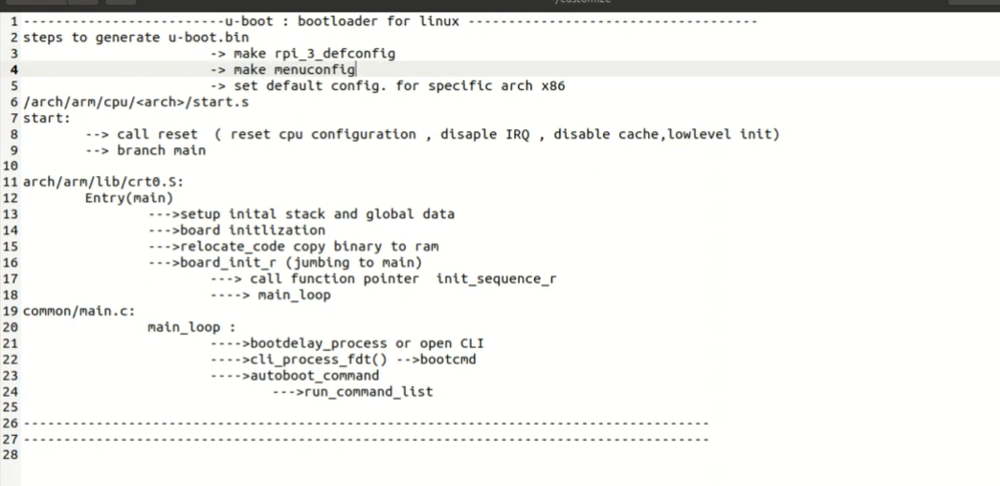

> For Raspberry Pi 4 (64-bit ARMv8 architecture) with the requirements you specified (Linux version 5.15.118, little endian, 64-bit, and GNU GCC 12.3.0), you can use U-Boot version 2023.10 or later. This version supports ARMv8 architecture and is compatible with the tools and kernel version you're using.

[u-boot source code](https://elixir.bootlin.com/u-boot/latest/sources) | [u-boot and kernel for raspi3b](https://github.com/Moatasem-Elsayed/Linux_Raspberrypi3b_image) | [U-boot steps for configuration](https://github.com/yusufsakr/RPI4_custom_image) | [config rpi4](https://andrei.gherzan.ro/linux/uboot-on-rpi/)


| **Feature**                           | **rpi_3_32b_defconfig**                  | **rpi_3_b_plus_defconfig**            | **rpi_3_defconfig**                 | **rpi_arm64_defconfig**             | **rpi_4_32b_defconfig**             | **rpi_4_defconfig**                |
|---------------------------------------|------------------------------------------|--------------------------------------|------------------------------------|------------------------------------|-----------------------------------|----------------------------------|
| **Target Platform**                   | Raspberry Pi 3 (32-bit)                  | Raspberry Pi 3 B+ (64-bit)            | Raspberry Pi 3 (64-bit)            | Raspberry Pi 3 and other ARMv8 boards (64-bit) | Raspberry Pi 4 (32-bit)             | Raspberry Pi 4 (64-bit)            |
| **CPU Architecture**                  | ARMv7 (32-bit)                           | ARMv8 (64-bit)                       | ARMv8 (64-bit)                     | ARMv8 (64-bit)                     | ARMv8 (32-bit)                     | ARMv8 (64-bit)                     |
| **CPU**                               | Broadcom BCM2837 (Cortex-A53)            | Broadcom BCM2837B0 (Cortex-A53)      | Broadcom BCM2837 (Cortex-A53)      | Generic ARMv8 (Cortex-A53)         | Broadcom BCM2711 (Cortex-A72)      | Broadcom BCM2711 (Cortex-A72)      |
| **Core Count**                        | 4 cores                                  | 4 cores                              | 4 cores                            | 4 cores                            | 4 cores                            | 4 cores                            |
| **CPU Frequency**                     | 1.2 GHz                                  | 1.4 GHz                              | 1.2 GHz                            | Configurable                       | 1.5 GHz                            | 1.5 GHz                            |
| **Memory**                            | 1 GB LPDDR2                              | 1 GB LPDDR2                          | 1 GB LPDDR2                        | Configurable                       | 2 GB, 4 GB, or 8 GB LPDDR4         | 2 GB, 4 GB, or 8 GB LPDDR4         |
| **Ethernet**                          | 10/100 Mbps                              | Gigabit Ethernet (USB 2.0)           | 10/100 Mbps                        | Configurable                       | Gigabit Ethernet                   | Gigabit Ethernet                   |
| **Wi-Fi**                             | 802.11n (Wi-Fi 4)                        | 802.11ac (Wi-Fi 5)                   | 802.11n (Wi-Fi 4)                  | Configurable                       | 802.11ac (Wi-Fi 5)                 | 802.11ac (Wi-Fi 5)                 |
| **Bluetooth**                         | Bluetooth 4.2                            | Bluetooth 4.2                        | Bluetooth 4.2                      | Configurable                       | Bluetooth 5.0                      | Bluetooth 5.0                      |
| **USB Ports**                         | 4 × USB 2.0                              | 4 × USB 2.0                          | 4 × USB 2.0                        | Configurable                       | 2 × USB 3.0, 2 × USB 2.0           | 2 × USB 3.0, 2 × USB 2.0           |
| **Display Interface**                 | DSI and HDMI                             | DSI and HDMI                         | DSI and HDMI                       | Configurable                       | DSI, HDMI, and MIPI-DSI            | DSI, HDMI, and MIPI-DSI            |
| **Camera Interface**                  | CSI interface                            | CSI interface                        | CSI interface                      | Configurable                       | CSI interface                      | CSI interface                      |
| **Boot Loader**                       | U-Boot for 32-bit Raspberry Pi 3         | U-Boot for Raspberry Pi 3 B+         | U-Boot for Raspberry Pi 3          | U-Boot for ARMv8 (64-bit)          | U-Boot for Raspberry Pi 4 (32-bit) | U-Boot for Raspberry Pi 4 (64-bit) |
| **Power Supply**                      | 5V/2.5A Micro USB                        | 5V/2.5A USB-C                        | 5V/2.5A Micro USB                  | Configurable                       | 5V/3A USB-C                        | 5V/3A USB-C                        |
| **Power-over-Ethernet (PoE)**         | Not supported                            | Supported (via separate HAT)         | Not supported                      | Configurable                       | Supported (via separate HAT)       | Supported (via separate HAT)       |
| **SD Card Support**                   | microSD                                   | microSD                               | microSD                             | microSD                            | microSD                             | microSD                             |
| **Kernel Support**                    | 32-bit kernel                            | 64-bit kernel                        | 64-bit kernel                       | 64-bit kernel                      | 32-bit kernel                       | 64-bit kernel                       |
| **Recommended Usage**                 | Raspberry Pi 3 (32-bit OS)               | Raspberry Pi 3 B+ (64-bit OS)         | Raspberry Pi 3 (64-bit OS)         | Generic ARMv8 boards (64-bit OS)  | Raspberry Pi 4 (32-bit OS)          | Raspberry Pi 4 (64-bit OS)          |
| **Microphone/Audio Recording Support** | Supported with external mic via USB or audio jack | Supported with external mic via USB or audio jack | Supported with external mic via USB or audio jack | Supported with external mic via USB or audio jack | Supported with external mic via USB or audio jack | Supported with external mic via USB or audio jack |



>**Raspberry Pi 3B:** Fully emulated in QEMU using the -M raspi3 machine type with ARMv7 (32-bit) and ARMv8 (64-bit) kernel configurations.
>
>**Raspberry Pi 3B+:** Limited support in QEMU, with more general emulation for the BCM2837B0 SoC. You can use the Raspberry Pi 3B emulation for most of the setup but may lack certain hardware features.
>


> We select **rpi_4_defconfig**

```bash

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ ls configs/ | grep rpi
    rpi_0_w_defconfig
    rpi_2_defconfig
    rpi_3_32b_defconfig
    rpi_3_b_plus_defconfig
    rpi_3_defconfig
    rpi_4_32b_defconfig
    rpi_4_defconfig
    rpi_arm64_defconfig
    rpi_defconfig

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ qemu-system-aarch64 -machine help | grep -i raspi
    raspi0               Raspberry Pi Zero (revision 1.2)
    raspi1ap             Raspberry Pi A+ (revision 1.1)
    raspi2b              Raspberry Pi 2B (revision 1.1)
    raspi3ap             Raspberry Pi 3A+ (revision 1.0)
    raspi3b              Raspberry Pi 3B (revision 1.2)
    raspi4b              Raspberry Pi 4B (revision 1.5)

    export CROSS_COMPILE=/home/ferganey/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-
    export ARCH=arm64
    export SYSROOT=$(aarch64-rpi4-linux-gnu-gcc -print-sysroot)

```


---
---


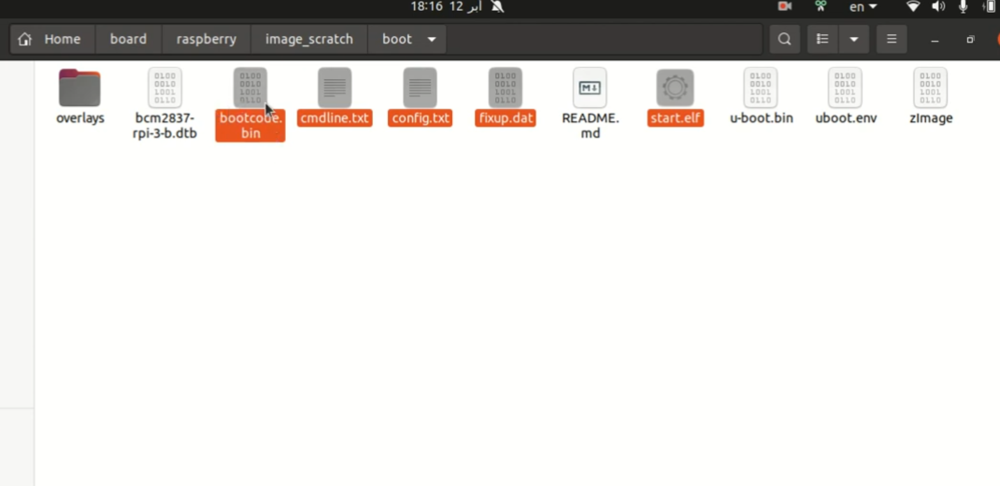
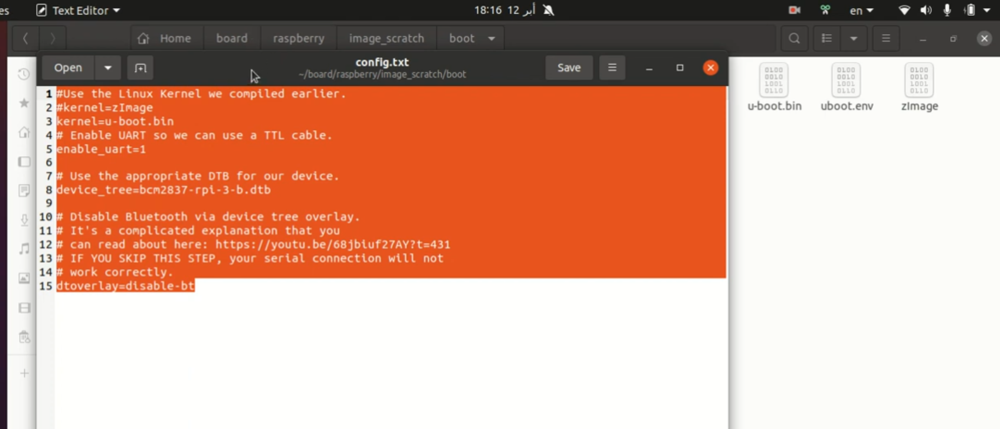
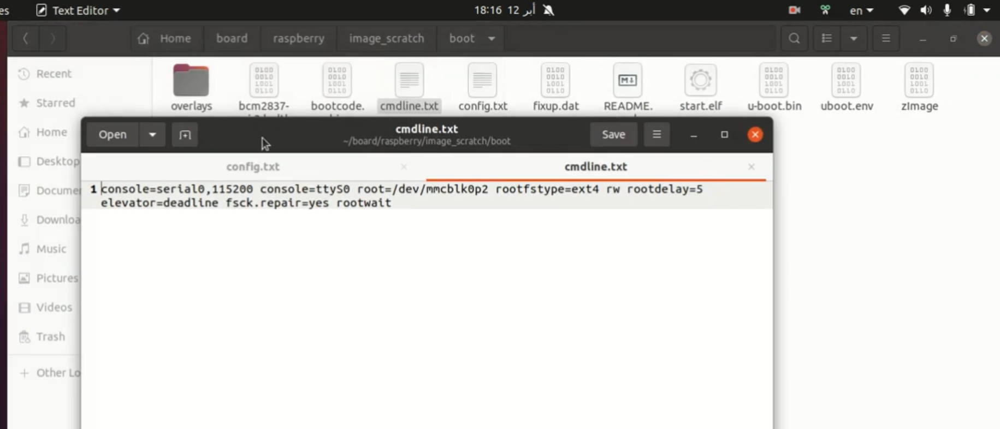

[Build a Raspberry Pi Linux System the Hard Way](https://rickcarlino.com/2021/build-a-raspbery-pi-linux-system-the-hard-way.html) | [step by step](https://github.com/yusufsakr/RPI4_custom_image)

```bash

ferganey@ferganey-linux:~$ cd ~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ ls configs/ | grep rpi
    rpi_4_defconfig

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader$ git clone https://source.denx.de/u-boot/u-boot.git

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader$ cd u-boot

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ git checkout v2021.10

git checkout v2023.10

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ export PATH=${HOME}/x-tools/aarch64-rpi4-linux-gnu/bin/:$PATH
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ export CROSS_COMPILE=aarch64-rpi4-linux-gnu-
ferganey@ferganey-linux:~/Embedded_Systems/busybox$ export CROSS_COMPILE=${HOME}/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ make rpi_4_defconfig
    aarch64-rpi4-linux-gnu-gcc (crosstool-NG 1.26.0) 12.3.0
    Copyright (C) 2022 Free Software Foundation, Inc.
    This is free software; see the source for copying conditions.  There is NO
    warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ make menuconfig
```
```plaintext
  │ │                   [*] Support for booting from SD/EMMC                                                      │ │  
  │ │                   [*] Support substituting strings in boot arguments                                        │ │  
  │ │                   (run distro_bootcmd) bootcmd value                                                        │ │  
  │ │                   (U-Boot: ahmedferganey> ) Shell prompt                                                    │ │  
  │ │                   [*] strings - display strings in memory                                                   │ │  
  │ │                   [*] GPT (GUID Partition Table) command                                                    │ │  
  │ │                   [*]   Enable support of GUID for partition type                                           │ │  


```
```plaintext

                                    ######      boot options        ######
  <!-- │ │                   [*] Saves fdt address, passed by the previous bootloader, to env var                      │ │   -->
  │ │                   [*] Enable boot arguments                                                                 │ │  
  │ │                   [ ] Enable preboot                                                                        │ │  
  │ │                   [*] Support substituting strings in boot arguments                                        │ │ 
  <!-- │ │                   (pci enum; usb start;) preboot default value                                              │ │  -->
  <!-- │ │                   (bcm2711-rpi-4-b.dtb) Default fdt file                                                    │ │   -->
  <!-- │ │                   [*] Enable boot arguments   ()                                                            │ │ 
  │ │                    Boot arguments (NEW) 
        console=ttyAMA0,115200 root=/dev/mmcblk0p2 rw rootfstype=ext4 init=/bin/bash -->
  │ │                   [*] Enable a default value for bootcmd                                                    │ │  
  │ │                   (load mmc 0:1 0x3000000 boot.scr; source 0x3000000) bootcmd value                         │
                                    ######      console options        ######
  │ │                   [*] Update environment variables during console init                                      │ │  


                                    ######      logging options        ######
  │ │                   [*] Enable logging support                                                                │ │  


                                    ######      inti options        ######
  │ │                   [] Display information about the CPU during start up                                      │ │  
  │ │                   [] Display information about the board during early start up                              │ │


                                      ######      Logging options        #####
  │ │                   [*] Stack Protector buffer overflow detection                                             │ │  



                                    ######      command  options        ######
Device access commands:
  │ │                   [*] loadm                                                                                 │ │  


                                    ######      device tre contorl options        ######
  │ │                   (0x10000) Size of memory reserved to uncompress the DTBs                                  │ │  


                                    ######      environment commands        ######

  │ │                   [*] env load                                                                              │ │  

                                    ######      serial        ######
  │ │                   (115200) Default baudrate                                                                 │ │  
  │ │                   [*]   Require a serial port for console                                                   │ │  
   

                                    ######      uhs        ######
  │ │                   [*] MMC debugging                                                                         │ │  

```


```bash


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ sudo apt install libncurses-dev libssl-dev libz-dev device-tree-compiler python3 libfdt-dev swig uuid-dev

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ make

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ sudo apt install minicom # will used later for hardware connectivity


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ make tools

# if you faced issues in build or later you can,
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ 

    make distclean   or make clean

```

#### **Important configuration for custom application "Speech Recognition"**


When configuring U-Boot for the Raspberry Pi 3B in an autonomous vehicle application that involves running AI models (like Whisper) containerized with Docker, there are several critical configurations you need to consider. These configurations ensure support for 64-bit architecture, Docker compatibility, AI workloads, and hardware peripherals like audio input via a microphone.


```bash

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ ls
    arch   common     doc      examples  Kconfig   Makefile     scripts     u-boot      u-boot.map
    board  config.mk  drivers  fs        lib       net          System.map  u-boot.bin  u-boot-nodtb.bin

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ file u-boot
    u-boot: ELF 64-bit LSB executable, ARM aarch64, version 1 (SYSV), statically linked, with debug_info, not stripped


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ file u-boot.bin
    u-boot.bin: PCX ver. 2.5 image data bounding box [8223, 54531] - [0, 8], 20-bit uncompressed

```

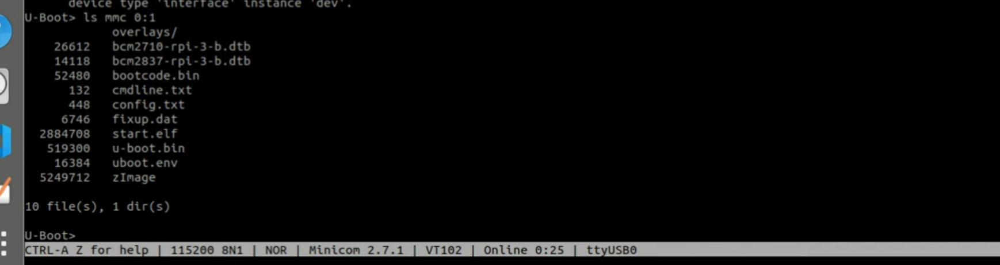


> Expected output from make u-boot -->
>   - u-boot.bin which transfered to boot/

> we will need also integrate at the same dir some other files 
>   - bootcode.bin
>   - cmdline.txt
>   - config.txt
>   - fixup.dat
>   - start.elf
>   - kernel7.img
>   - bcm2710-rpi-3-b.dtb
>   - u-boot.env



**the final output for raspi4 config file**
```plaintext
CONFIG_ARM=y
CONFIG_ARCH_BCM283X=y
CONFIG_TEXT_BASE=0x00080000
CONFIG_TARGET_RPI_4=y
CONFIG_HAS_CUSTOM_SYS_INIT_SP_ADDR=y
CONFIG_CUSTOM_SYS_INIT_SP_ADDR=0x7fffe30
CONFIG_ENV_SIZE=0x4000
CONFIG_DEFAULT_DEVICE_TREE="bcm2711-rpi-4-b"
CONFIG_OF_LIBFDT_OVERLAY=y
CONFIG_DM_RESET=y
CONFIG_SYS_LOAD_ADDR=0x1000000
CONFIG_PCI=y
CONFIG_BOOTSTD_DEFAULTS=y
CONFIG_OF_BOARD_SETUP=y
CONFIG_USE_PREBOOT=y
CONFIG_PREBOOT="pci enum; usb start;"
# CONFIG_DISPLAY_CPUINFO is not set
# CONFIG_DISPLAY_BOARDINFO is not set
CONFIG_MISC_INIT_R=y
CONFIG_FDT_SIMPLEFB=y
CONFIG_SYS_PROMPT="U-Boot> "
CONFIG_SYS_PBSIZE=1049
CONFIG_CMD_DFU=y
CONFIG_CMD_GPIO=y
CONFIG_CMD_MMC=y
CONFIG_CMD_PCI=y
CONFIG_CMD_USB=y
CONFIG_CMD_FS_UUID=y
CONFIG_ENV_FAT_DEVICE_AND_PART="0:1"
CONFIG_SYS_RELOC_GD_ENV_ADDR=y
CONFIG_ENV_VARS_UBOOT_RUNTIME_CONFIG=y
CONFIG_TFTP_TSIZE=y
CONFIG_DM_DMA=y
CONFIG_DFU_MMC=y
CONFIG_SYS_DFU_DATA_BUF_SIZE=0x100000
CONFIG_SYS_DFU_MAX_FILE_SIZE=0x200000
CONFIG_BCM2835_GPIO=y
CONFIG_MMC_SDHCI=y
CONFIG_MMC_SDHCI_SDMA=y
CONFIG_MMC_SDHCI_BCM2835=y
CONFIG_BCMGENET=y
CONFIG_PCI_BRCMSTB=y
CONFIG_PINCTRL=y
# CONFIG_PINCTRL_GENERIC is not set
CONFIG_DM_RNG=y
CONFIG_RNG_IPROC200=y
# CONFIG_REQUIRE_SERIAL_CONSOLE is not set
CONFIG_SYSINFO=y
CONFIG_SYSINFO_SMBIOS=y
CONFIG_USB=y
CONFIG_DM_USB_GADGET=y
CONFIG_USB_XHCI_HCD=y
CONFIG_USB_XHCI_PCI=y
CONFIG_USB_KEYBOARD=y
CONFIG_USB_GADGET=y
CONFIG_USB_GADGET_MANUFACTURER="FSL"
CONFIG_USB_GADGET_VENDOR_NUM=0x0525
CONFIG_USB_GADGET_PRODUCT_NUM=0xa4a5
CONFIG_USB_GADGET_DWC2_OTG=y
CONFIG_USB_GADGET_DOWNLOAD=y
CONFIG_VIDEO=y
# CONFIG_VIDEO_BPP8 is not set
# CONFIG_VIDEO_BPP16 is not set
CONFIG_SYS_WHITE_ON_BLACK=y
CONFIG_VIDEO_BCM2835=y
CONFIG_CONSOLE_SCROLL_LINES=10
CONFIG_PHYS_TO_BUS=y


# my configuration manually
CONFIG_ENV_SETTINGS="
    bootargs=console=ttyAMA0,115200 root=/dev/mmcblk0p2 rootfstype=ext4
    setenv bootargs console=ttyAMA0,115200 root=/dev/mmcblk0p2 rootfstype=ext4
"
CONFIG_CONSOLE_MUX=y
CONFIG_SYS_CONSOLE_INFO_QUIET=y
CONFIG_BOOTDELAY=3
CONFIG_BOOTRETRY=y
CONFIG_BOOTCMD="mmc dev 0; mmc read 0x1000000 0x800 0x4000; bootm 0x1000000"

```

---
---

## **Linux Kernel**

**Linux Kernel**

[Raspberry-pi-4-model-b official specs](https://www.raspberrypi.com/products/raspberry-pi-4-model-b/specifications/)

> bcm2711_defconfig	Raspberry Pi 4, Compute Module 4	ARMv8 64-bit

[Johannes 4GNU_Linux](https://www.youtube.com/@johannes4gnu_linux96/playlists) | [Johannes4Linux Github](https://github.com/Johannes4Linux) | [Moatassam El  sayed](https://www.youtube.com/watch?v=xAvswOlQMP0&list=PLkH1REggdbJpFXAzQqpjZgV1oghPsf9OH&index=20) | [raspi linux github](https://github.com/raspberrypi/linux) | [linux device driver](https://www.youtube.com/watch?v=XoYkHUnmpQo) | [raspi doc](https://www.raspberrypi.com/documentation/computers/linux_kernel.html)

> other resources 
[bcmrpi3](https://github.com/sakaki-/bcmrpi3-kernel) | [raspberrypi](https://www.raspberrypi.com/documentation/computers/linux_kernel.html) | [vaporator_system_rpi3](https://hexdocs.pm/vaporator_system_rpi3/readme.html) | [configure-the-kernel](https://www.raspberrypi.com/documentation/computers/linux_kernel.html#configure-the-kernel)

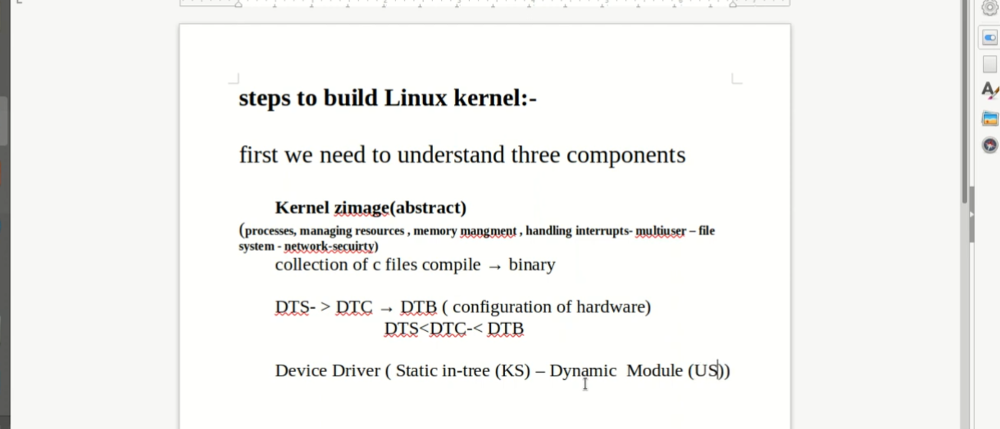

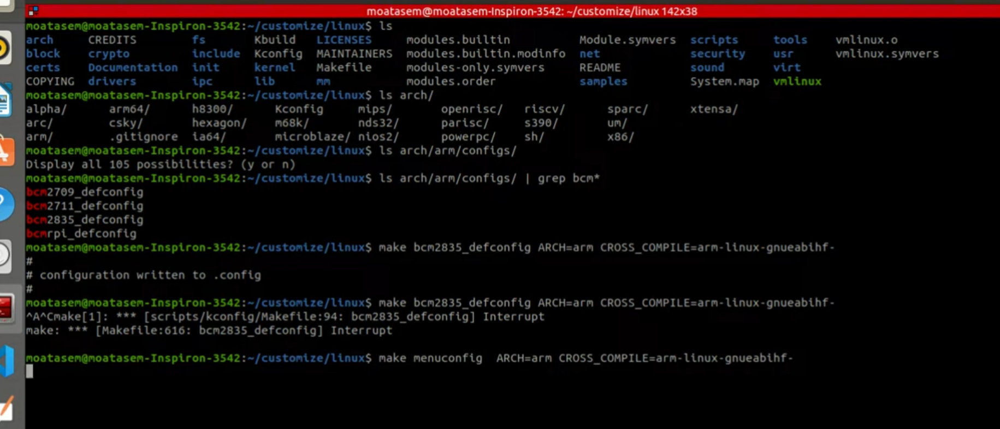

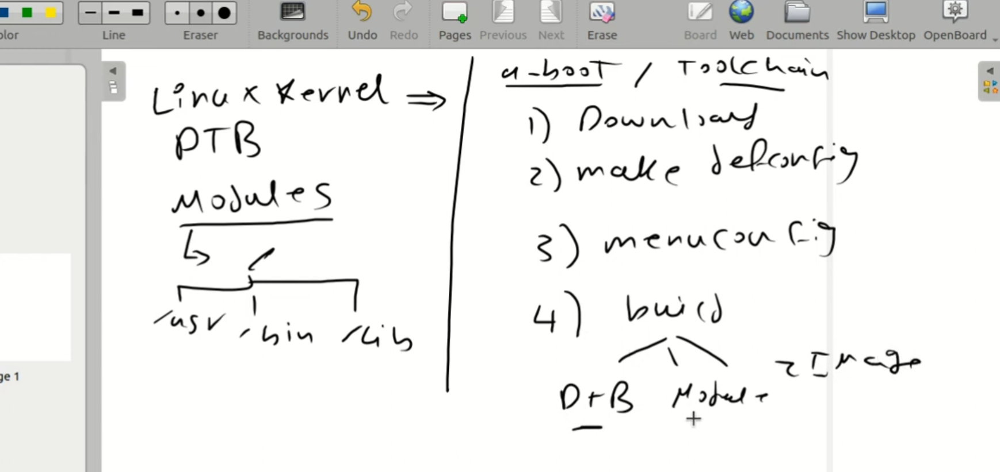

> Recomendded 6.1.58

```bash
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux$ export PATH=${HOME}/x-tools/aarch64-rpi4-linux-gnu/bin/:$PATH

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux$ export CROSS_COMPILE=aarch64-rpi4-linux-gnu-
ferganey@ferganey-linux:~/Embedded_Systems/busybox$ CROSS_COMPILE=${HOME}/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux$ git clone https://github.com/raspberrypi/linux

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux$ cd ./linux

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ ls ./arch/arm64/configs
    {
        bcm2711_defconfig  bcmrpi3_defconfig  defconfig
    }
    bcm2709_defconfig            
    bcm2711_defconfig                          
    bcm2835_defconfig                         
    bcmrpi_defconfig                        
    versatile_defconfig
    vexpress_defconfig
    bcm2837_defconfig
{
    (https://www.raspberrypi.com/documentation/computers/linux_kernel.html)
    cd linux
    KERNEL=kernel8
    make bcm2711_defconfig
}

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ git checkout  -b rpi-5.10.y
             rpi-5.10.y

# we will specify kernel in config.txt later
# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ KERNEL=kernel8 


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ make ARCH=arm64 CROSS_COMPILE=aarch64-rpi4-linux-gnu- bcm2711_defconfig

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ make ARCH=arm64 CROSS_COMPILE=aarch64-rpi4-linux-gnu- menuconfig 
```


```plaintext

######################           General setup              ######################

  │ │                   [ ] Initial RAM filesystem and RAM disk (initramfs/initrd) support                     │ │  
  │ │                   [ ] Boot config support                                                                │ │ 

######################           kernel features               ######################
  │ │                       Timer frequency (300 HZ)  --->                                                        │ │  
       
######################            Boot options                ######################
console=ttyAMA0,115200 root=/dev/mmcblk0p2 rw rootfstype=ext4 init=/bin/bash rootwait debug earlyprintk

######################           character device             ######################
  │ │                   <*>   NULL TTY driver                                                                     │ │  


######################          File systems              ######################
  │ │                   < > Overlay filesystem support                                                            │ │  

######################          arm64 Debugging               ######################

  │ │                   <*> CoreSight Tracing Support  --->                                                       │ │  
  │ │                   --- CoreSight Tracing Support                                                             │ │  
  │ │                   -*-   CoreSight Link and Sink drivers                                                     │ │  
  │ │                   < >     Coresight generic TMC driver (NEW)                                                │ │  
  │ │                   < >     Coresight generic TPIU driver (NEW)                                               │ │  
  │ │                   < >     Coresight ETBv1.0 driver (NEW)                                                    │ │  
  │ │                   < >   CoreSight ETMv4.x / ETE driver                                                      │ │  
  │ │                   <*>   CoreSight System Trace Macrocell driver                                             │ │  
  │ │                   <*>   CoreSight CPU Debug driver                                                          │ │  
  │ │                   < >   CoreSight Cross Trigger Interface (CTI) driver (NEW)                                │



######################          printk and dmesg options               ######################

  │ │                   [*] Show timing information on printks                                                    │ │  
  │ │                   [*] Show caller information on printks                                                    │ │  
  │ │                   [ ] Show build ID information in stacktraces                                              │ │  
  │ │                   (7) Default console loglevel (1-15)                                                       │ │  
  │ │                   (4) quiet console loglevel (1-15)                                                         │ │  
  │ │                   (4) Default message log level (1-7)                                                       │ │  
  │ │                   [*] Delay each boot printk message by N milliseconds                                      │ │  
  │ │                   [*] Enable dynamic printk() support                                                       │ │  
  │ │                   -*- Enable core function of dynamic debug support                                         │ │  
  │ │                   [*] Support symbolic error names in printf                                                │ │  
  │ │                   [*] Verbose BUG() reporting (adds 70K)                                                    │ │  
  │ │                                                                                                             │ │

```



```bash
# ensure that 

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ nano ~/.bashrc
# export INSTALL_MOD_PATH=/home/ferganey/Embedded_Systems/other_resources/practical/Rpi4
# source ~/.bashrc


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ make -j$(nproc) Image.gz modules dtbs ARCH=arm64 CROSS_COMPILE=aarch64-rpi4-linux-gnu-


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ make INSTALL_MOD_PATH=/home/ferganey/Embedded_Systems/other_resources/practical/Rpi4  ARCH=arm64 CROSS_COMPILE=aarch64-rpi4-linux-gnu- modules_install 

# if you need rebuild :
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ make ARCH=arm64 CROSS_COMPILE=aarch64-rpi4-linux-gnu- clean
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux$ make ARCH=arm64 CROSS_COMPILE=aarch64-rpi4-linux-gnu- mrproper
    ## then repeat steps from above

```


![](https://community.toradex.com/uploads/default/original/2X/9/952da4b2045e324aeb45f46139cae6c4c2f06cb2.png)

## **Busy Box**

---
---

**Busy Box**

[BusyBox RasPi3B](https://nayab.xyz/rpi3b-elinux/embedded-linux-rpi3-060-busybox.html) | [BusyBox Official](https://www.busybox.net/)

> **Busybox** is a software suite, that generates **a minimal root file system** with an init program, the shell and basic Linux utilities.



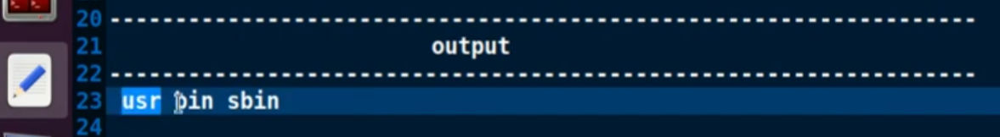



```bash

ferganey@ferganey-linux:~/Embedded_Systems$ git clone git://busybox.net/busybox.git

ferganey@ferganey-linux:~/Embedded_Systems/busybox$ cd busybox

ferganey@ferganey-linux:~/Embedded_Systems/busybox$ mkdir output && cd ./output && mkdir minimal_root && cd ./minimal_root

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/busybox$ git checkout 1_36_1


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ export PATH=${HOME}/x-tools/aarch64-rpi4-linux-gnu/bin/:$PATH
# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot$ export CROSS_COMPILE=aarch64-rpi4-linux-gnu-

# # the next step is critical
ferganey@ferganey-linux:~/Embedded_Systems/busybox$ CROSS_COMPILE=${HOME}/x-tools/aarch64-rpi4-linux-gnu/bin/aarch64-rpi4-linux-gnu-

ferganey@ferganey-linux:~/Embedded_Systems/busybox$ make CROSS_COMPILE="$CROSS_COMPILE" defconfig

# ferganey@ferganey-linux:~/Embedded_Systems/busybox$  sed -i 's%^CONFIG_PREFIX=.*$%CONFIG_PREFIX="./output/minimal_root"%' .config


ferganey@ferganey-linux:~/Embedded_Systems/busybox$ make CROSS_COMPILE="$CROSS_COMPILE" menuconfig 

    Settings -> Build static binary 	(no shared libraries) 	Enable
    Settings -> Cross compiler prefix 	CROSS_COMPILE=aarch64-rpi4-linux-gnu-
    Settings -> Destination path for ‘make install’ 	Same as INSTALL_MOD_PATH from kernel modules ste  ---> ./output/minimal_root

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/busybox$  curl https://www.nayab.xyz/patches/0003-compile-error-fix-stime.patch --output ./0003-compile-error-fix-stime.patch

# ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/busybox$  git apply 0003-compile-error-fix-stime.patch


ferganey@ferganey-linux:~/Embedded_Systems/busybox$ make CROSS_COMPILE="$CROSS_COMPILE"

ferganey@ferganey-linux:~/Embedded_Systems/busybox$ sudo make  CROSS_COMPILE="$CROSS_COMPILE" install

    # Static linking against glibc, can't use --gc-sections
    # Trying libraries: m resolv rt
    # Library m is needed, can't exclude it (yet)
    # Library resolv is needed, can't exclude it (yet)
    # Library rt is not needed, excluding it
    # Library m is needed, can't exclude it (yet)
    # Library resolv is needed, can't exclude it (yet)
    # Final link with: m resolv


```



---

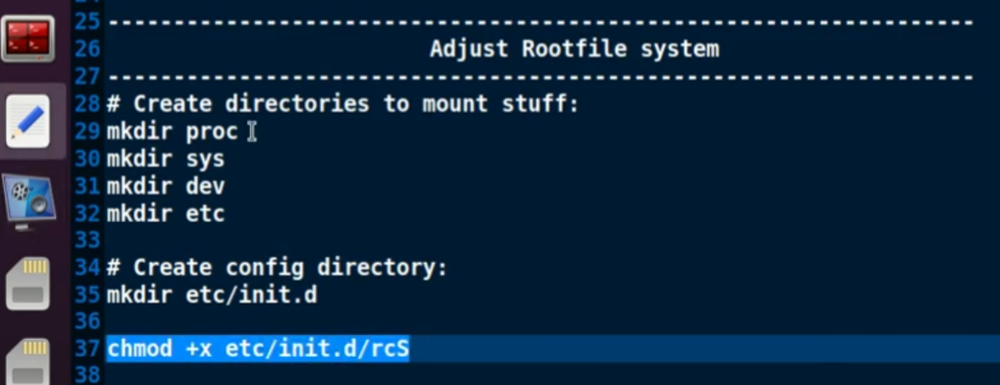

```bash
mkdir etc/init.d
touch etc/init.d/rcS
chmod +x etc/init.d/rcS
```

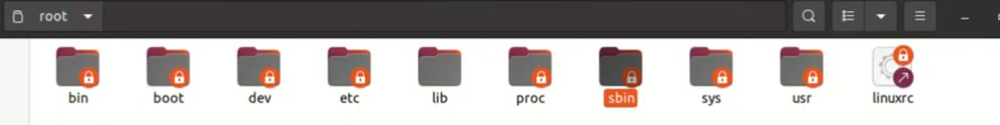
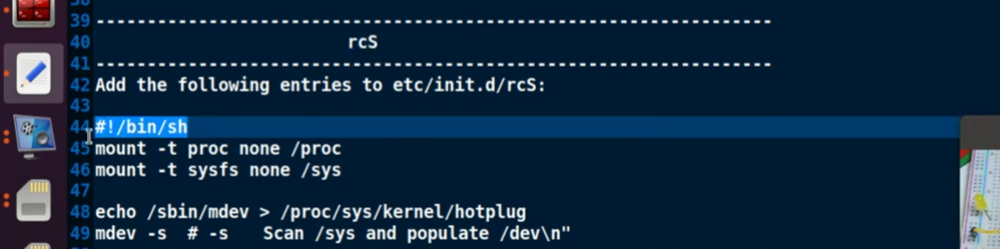

```bash
#!/bin/sh
mount -t proc none /proc
mount -t sysfs none /sys

echo /sbin/mdev > /proc/sys/kernel/hotplug
mdev -s  # -s	Scan /sys and populate /dev\n"
```

> Copy lib that gained via building kernel


**setup additional files**

> **kernel_address** is the memory address to which the kernel image should be loaded. By default, **32-bit kernels** are loaded to address **0x8000**, and **64-bit kernels** to address **0x200000**. If kernel_old is set, kernels are loaded to the address 0x0.

```bash
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ sudo touch boot.cmd

ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ sudo nano boot.cmd
{
# Set kernel boot arguments for Raspberry Pi 4
# - console=serial0,115200 for UART debugging
# - root=/dev/mmcblk0p2 for SD card root filesystem
# - earlyprintk and loglevel=7 for detailed boot logs
# - init=/sbin/init or /bin/sh for initial process                                                   
# - boot.scr: A compiled script file (u-boot.scr) used by U-Boot to execute commands.

  GNU nano 7.2                                                           boot.cmd *                                                                   
setenv bootargs "console=ttyAMA0,115200 root=/dev/mmcblk0p2 rw rootfstype=ext4 init=/bin/bash rootwait debug earlyprintk"

setenv fdtfile bcm2711-rpi-4-b.dtb

mmc dev 0 0
fatload mmc 0:0 0x200000 Image
fatload mmc 0:0 0x2800000  bcm2711-rpi-4-b.dtb
booti 0x200000 - 0x2800000





}

ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which mkimage
   /home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot/tools/mkimage

ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ sudo ln -s /home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot/tools/mkimage /usr/local/bin/mkimage
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ sudo mkimage -A arm -T script -C none -n "Boot Script" -d ./boot.cmd ./boot.scr
Image Name:   Boot Script
Created:      Sun Dec 29 02:58:22 2024
Image Type:   ARM Linux Script (uncompressed)
Data Size:    198 Bytes = 0.19 KiB = 0.00 MiB
Load Address: 00000000
Entry Point:  00000000
Contents:
   Image 0: 190 Bytes = 0.19 KiB = 0.00 MiB
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ 


ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ 
 hexdump -C /home/ferganey/Embedded_Systems/Autonomous_Vhehicle_GradProject/boot.scr
```
```plaintext
{
00000000  27 05 19 56 e2 87 bc 29  67 6e 1b a8 00 00 00 bf  |'..V...)gn......|
00000010  00 00 00 00 00 00 00 00  4e 42 ea 3a 05 02 06 00  |........NB.:....|
00000020  42 6f 6f 74 20 53 63 72  69 70 74 00 00 00 00 00  |Boot Script.....|
00000030  00 00 00 00 00 00 00 00  00 00 00 00 00 00 00 00  |................|
00000040  00 00 00 b7 00 00 00 00  73 65 74 65 6e 76 20 62  |........setenv b|
00000050  6f 6f 74 61 72 67 73 20  63 6f 6e 73 6f 6c 65 3d  |ootargs console=|
00000060  74 74 79 53 30 2c 31 31  35 32 30 30 20 72 6f 6f  |ttyS0,115200 roo|
00000070  74 3d 2f 64 65 76 2f 6c  6f 6f 70 31 38 70 32 20  |t=/dev/loop18p2 |
00000080  72 6f 6f 74 66 73 74 79  70 65 3d 65 78 74 34 20  |rootfstype=ext4 |
00000090  72 6f 6f 74 77 61 69 74  0a 6c 6f 61 64 20 6d 6d  |rootwait.load mm|
000000a0  63 20 30 3a 31 20 30 78  38 30 30 30 20 2f 62 6f  |c 0:1 0x8000 /bo|
000000b0  6f 74 2f 49 6d 61 67 65  0a 6c 6f 61 64 20 6d 6d  |ot/Image.load mm|
000000c0  63 20 30 3a 31 20 30 78  31 30 30 30 30 20 2f 62  |c 0:1 0x10000 /b|
000000d0  6f 6f 74 2f 62 63 6d 32  37 31 31 2d 72 70 69 2d  |oot/bcm2711-rpi-|
000000e0  34 2d 62 2e 64 74 62 0a  62 6f 6f 74 69 20 30 78  |4-b.dtb.booti 0x|
000000f0  38 30 30 30 20 2d 20 30  78 31 30 30 30 30 0a     |8000 - 0x10000.|
000000ff
}
```


---
---

## **Sd-Card**

**SD-Card and Automoate Copying**

[links issue ](https://forums.raspberrypi.com/viewtopic.php?t=364131#:~:text=This%20makes%20sense%20because%20fat32,create%20new%20links%20as%20well.) | [Loading Environment from FAT Warning - bad CRC](https://e2e.ti.com/support/processors-group/processors/f/processors-forum/935448/linux-am5749-loading-environment-from-fat-warning---bad-crc-using-default-environment) | [Critical steps](https://docs.sel4.systems/Hardware/Rpi4.html)



```bash
#!/bin/bash

# Variables
# SD_IMAGE="sd.img"
MOUNT_DIR="./mnt"
BOOT_PART="$MOUNT_DIR/boot"
ROOTFS_PART="$MOUNT_DIR/rootfs"
RPi_REPO="/home/ferganey/Embedded_Systems/Autonomous_Vhehicle_GradProject/rpirepo"
KERNEL_DIR="/home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/kernel/Raspi_Linux/linux"
BUSYBOX_DIR="/home/ferganey/Embedded_Systems/busybox"
OUTPUT_DIR="/home/ferganey/Embedded_Systems/busybox/output/minimal_root"
UBOOT_DIR="/home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/bootloader/u-boot"
MODULES_DIR="/home/ferganey/Embedded_Systems/other_resources/practical/Rpi4/lib/modules/5.15.92-v8+"
BOOT_SCR_PATH="/home/ferganey/Embedded_Systems/Autonomous_Vhehicle_GradProject"


############################################################################################################

# calling process  - bootcode.bin 
#                  - start4.elf  
#                  - fixup4.dat   
#                  - config.txt  
#                  - boot.scr 
#                  - u-boot.bin  
#                  - Image  
#                  - bcm2711-rpi-4-b.dtb  
#                  - overlays  
#                  - uboot.env  
#                  - busybox  
#                  - modules  
#                  - cross-toolchain


# Verify Boot Process:
##  Firmware Stage:
    ###  Ensure bootcode.bin, start4.elf, and fixup4.dat are correctly placed in the boot partition.
    ###  config.txt points to u-boot.bin as the next bootloader.

##  U-Boot Stage:
    ###  U-Boot loads the kernel (Image) and device tree (bcm2711-rpi-4-b.dtb) based on boot.scr.

##  Kernel Stage:
    ###  The kernel uses the bootargs from U-Boot or cmdline.txt to initialize the system.

############################################################################################################


# Function to check command success
check_error() {
    if [ $? -ne 0 ]; then
        echo "Error during: $1. Exiting."
        exit 1
    fi
}

# Check for required commands
REQUIRED_CMDS=(dd parted losetup mkfs.vfat mkfs.ext4 mount cp mkdir)
for cmd in "${REQUIRED_CMDS[@]}"; do
    command -v $cmd > /dev/null || { echo "$cmd not found. Please install it."; exit 1; }
done

# Ensure directory permissions
ensure_directory() {
    local dir="$1"
    if [ ! -d "$dir" ]; then
        echo "$dir does not exist. Creating it..."
        mkdir -p "$dir"
        check_error "creating $dir"
    fi

    if [ ! -r "$dir" ] || [ ! -w "$dir" ]; then
        echo "Ensuring read and write permissions for $dir..."
        sudo chmod -R u+rw "$dir"
        sudo chown -R $(whoami):$(whoami) "$dir"
        check_error "setting permissions for $dir"
    fi
}

############################################################################################################

# Unmount existing mounts
sudo umount /media/ferganey/root
sudo umount /media/ferganey/boot
# sudo umount /dev/mmcblk0p1
# sudo umount /dev/mmcblk0p2
# Function to detect the SD card and its partitions
# detect_sd_card() {
#     # Check for the connected SD card (assuming mmcblk devices)
#     sd_card=$(lsblk -d -o NAME,TYPE,SIZE | grep 'mmcblk' | awk '{print $1}')

#     if [[ -z "$sd_card" ]]; then
#         echo "No SD card detected."
#         exit 1
#     else
#         echo "SD card detected: /dev/$sd_card"
#         partitions=$(lsblk /dev/$sd_card -o NAME | grep -E 'p[0-9]+')
#         echo "Partitions found: $partitions"
#     fi
# }

# # Function to unmount partitions
# umount_partitions() {
#     for partition in $partitions; do
#         echo "Unmounting /dev/$partition..."
#         sudo umount "/dev/$partition" 2>/dev/null
#         if [[ $? -eq 0 ]]; then
#             echo "/dev/$partition unmounted."
#         else
#             echo "/dev/$partition is not mounted or failed to unmount."
#         fi
#     done
# }

# # Function to zero out the partition data
# delete_and_zero_partition() {
#     for partition in $partitions; do
#         echo "Zeroing out /dev/$partition..."
#         sudo dd if=/dev/zero of="/dev/$partition" bs=1M status=progress
        
#         echo "Data wiped and partition zeroed: /dev/$partition"
#     done
# }

# # Main script execution
# detect_sd_card && \
# umount_partitions && \
# delete_and_zero_partition

# echo "All data on the SD card has been deleted and zeroed out."


############################################################################################################

# Ensure permissions for required directories
ensure_directory "$MOUNT_DIR"
ensure_directory "$BOOT_PART"
ensure_directory "$ROOTFS_PART"

# Create virtual SD card image
# echo "Creating SD card image..."
# sudo dd if=/dev/zero of=$SD_IMAGE bs=1M count=16384 status=progress
# check_error "creating SD card image"

# Detect the SD card device (physical SD card)
echo "Detecting physical SD card device..."
# Identify the SD card device based on size (assuming a 16GB card for this example)
    ## SD_IMAGE=$(lsblk -o NAME,SIZE | grep -E '.*16G.*' | awk '{print "/dev/" $1}')
    ## SD_IMAGE=$(lsblk -o NAME,SIZE,TYPE,MOUNTPOINT | grep -E '.*disk' | grep -v "loop" | awk '{print "/dev/" $1}')
SD_IMAGE=$(lsblk -o NAME,TYPE,SIZE | grep -E '^mmcblk[0-9]+.*disk' | awk '{print "/dev/" $1}')

if [ -z "$SD_IMAGE" ]; then
    echo "Error: No 64GB SD card detected. Please ensure it is connected and try again."
    exit 1
fi
echo "Physical SD card device detected: $SD_IMAGE"



# Step 4: Cleanup, Partition, and Format the SD Card
echo "Cleaning SD card..."
sudo wipefs -a "$SD_IMAGE"

if [[ $? -ne 0 ]]; then
    echo "Failed to clean the SD card. Ensure the device is not in use and try again."
    exit 1
fi

# Partition the SD card
echo "Partitioning the SD card..."

# Create a new partition table (msdos type)
if ! sudo parted $SD_IMAGE --script mklabel msdos; then
    echo "Error: Failed to create partition table."
    exit 1  
fi
echo "Partition table created successfully."

# Create the first partition (FAT32, 1MiB to 256MiB)
if ! sudo parted $SD_IMAGE --script mkpart primary fat32 1MiB 256MiB; then
    echo "Error: Failed to create boot partition."
    exit 1
fi
echo "Boot partition created successfully."

# Create the second partition (ext4, 256MiB to end of the SD card)
if ! sudo parted $SD_IMAGE --script mkpart primary ext4 256MiB 100%; then
    echo "Error: Failed to create root partition."
    exit 1
fi
echo "Root partition created successfully."

# Set the boot flag on the first partition
if ! sudo parted $SD_IMAGE --script set 1 boot on; then
    echo "Error: Failed to set boot flag on the boot partition."
    exit 1
fi
echo "Boot flag set successfully."

# # Map the SD card image to loop devices
# echo "Mapping SD card image to loop devices..."
# LOOP_DEVICE=$(sudo losetup -Pf --show $SD_IMAGE)
# check_error "mapping SD card image"
# echo "Mapped to $LOOP_DEVICE"

# # Check if LOOP_DEVICE is valid
# if [ -z "$LOOP_DEVICE" ]; then
#     echo "Error: Failed to map SD card image to loop device."
#     exit 1
# fi

# Format the partitions
echo "Formatting partitions..."
sudo mkfs.vfat -F 32 -n boot ${SD_IMAGE}p1
check_error "formatting boot partition"
sudo mkfs.ext4 -L root ${SD_IMAGE}p2
check_error "formatting root partition"

# Mount the partitions
echo "Mounting partitions..."
sudo mount ${SD_IMAGE}p1 $BOOT_PART
check_error "mounting boot partition"
sudo mount ${SD_IMAGE}p2 $ROOTFS_PART
check_error "mounting root partition"

# Verify mounts
echo "Verifying mounts..."
findmnt -M $BOOT_PART > /dev/null || { echo "$BOOT_PART is not mounted."; exit 1; }
findmnt -M $ROOTFS_PART > /dev/null || { echo "$ROOTFS_PART is not mounted."; exit 1; }

############################################################################################################

# Copy boot files
# https://github.com/raspberrypi/firmware/tree/stable/boot
echo "Copying boot files..."
sudo cp $RPi_REPO/{bootcode.bin,start4.elf,fixup4.dat} $BOOT_PART/
check_error "copying boot files"

############################################################################################################


# Copy bootscr to boot partition
echo "Copying bootscr..."
if [ -f "$BOOT_SCR_PATH/boot.scr" ]; then
    sudo chmod 644 "$BOOT_SCR_PATH/boot.scr"
    check_error "setting permissions on bootscr"
    sudo cp "$BOOT_SCR_PATH/boot.scr" $BOOT_PART/
    # Ensure the file on the boot partition has the correct permissions (644)
    sudo chmod 644 $BOOT_PART/boot.scr
    check_error "setting permissions on copied bootscr"

    echo "bootscr copied and permissions set successfully."
else
    echo "Error: bootscr file not found at $BOOT_SCR_PATH."
    exit 1
fi

############################################################################################################

# # Create cmdline.txt
# echo "Creating cmdline.txt..."
# echo "console=serial0,115200 root=/dev/mmcblk0p2 rootfstype=ext4 fsck.repair=yes rootwait earlyprintk=serial,ttyAMA0,115200" | sudo tee "$BOOT_PART/cmdline.txt" > /dev/null
# check_error "creating cmdline.txt"
# # This option is used for outputting the boot messages to the first serial port (ttyS0), which could be connected to a serial terminal or a serial debug console.


# # Create uboot.env
echo "Creating uboot.env..."
# Create an empty uboot.env file
sudo touch "$BOOT_PART/uboot.env"
# Check if the file was created successfully
check_error "creating empty uboot.env"


# Create config.txt
# Create config.txt
# https://www.raspberrypi.com/documentation/computers/config_txt.html#boot-options
# https://www.raspberrypi.com/documentation/computers/legacy_config_txt.html
echo "Creating config.txt..."
cat <<EOF | sudo tee "$BOOT_PART/config.txt" > /dev/null
enable_uart=1
kernel=u-boot.bin
arm_64bit=1
disable_splash=1
dtoverlay=disable-bt
EOF
check_error "creating config.txt"


############################################################################################################

# Copy kernel, device tree, U-Boot files, and overlays
echo "Copying kernel, U-Boot, device tree files..."
sudo cp $KERNEL_DIR/arch/arm64/boot/Image $BOOT_PART/
sudo cp $KERNEL_DIR/arch/arm64/boot/dts/broadcom/bcm2711-rpi-4-b.dtb $BOOT_PART/
sudo cp $UBOOT_DIR/u-boot.bin $BOOT_PART/

# Ensure kernel and U-Boot files were copied successfully
if [ -f "$BOOT_PART/u-boot.bin" ] && [ -f "$BOOT_PART/Image" ]; then
    echo "U-Boot and Kernel images were copied successfully."
else
    echo "Error: U-Boot or Kernel images were not copied."
    exit 1
fi

# # Copy overlays
# echo "Copying overlays..."
#     # Ensure the target directory exists
# sudo mkdir -p $BOOT_PART/overlays
#     # Copy the overlays using rsync, and suppress ownership and group errors
# sudo rsync -av --copy-links --no-owner --no-group $KERNEL_DIR/arch/arm64/boot/dts/overlays/*.dtb* $BOOT_PART/overlays/
#     # Check if the rsync command was successful
# if [ $? -eq 0 ]; then
#     echo "Overlays copied successfully."
# else
#     echo "Error: Failed to copy overlays."
# fi

############################################################################################################


# Set up root filesystem
echo "Setting up root filesystem..."
sudo mkdir -p $ROOTFS_PART/{lib,etc,tmp,proc,sys,dev,home,lib64,run,usr/{bin,lib,sbin,include},var/log}
sudo rsync -a $OUTPUT_DIR/ $ROOTFS_PART/
check_error "setting up root filesystem"
# Check if BusyBox was copied successfully
if [ -f "$ROOTFS_PART/bin/busybox" ]; then
    echo "BusyBox was copied successfully via --install -s"
else
    echo "Error: BusyBox was not copied."
    exit 1
fi

# Copy shared libraries if needed
STATIC_CHECK=$(file $BUSYBOX_DIR/output/minimal_root/bin/busybox | grep "statically linked")
if [ -z "$STATIC_CHECK" ]; then
    # Copy shared libraries (if BusyBox is dynamically linked):
    echo "Copying shared libraries..."
    SYSROOT=$(aarch64-rpi4-linux-gnu-gcc -print-sysroot)
    sudo cp -rL ${SYSROOT}/lib/* $ROOTFS_PART/lib/
    sudo cp -rL ${SYSROOT}/lib64/* s$ROOTFS_PART/lib64/
    sudo cp -rL ${SYSROOT}/usr/lib/* $ROOTFS_PART/usr/lib/
    check_error "copying shared libraries"
else
    echo "BusyBox is statically linked. Skipping shared libraries."
fi


if [ -z "$STATIC_CHECK" ]; then
    # If BusyBox is dynamically linked, copy toolchain libraries
    echo "Copying cross-toolchain libraries..."
    # this line if you use busy box as static linked {Static linking means that all 
    #   necessary libraries are bundled into the BusyBox binary itself. Therefore, there is no need 
    #   to copy the shared libraries from the toolchain}
    sudo cp -r /home/ferganey/x-tools/aarch64-rpi4-linux-gnu/lib/* $ROOTFS_PART/usr/lib/
    check_error "copying cross-toolchain libraries"
else
    # If BusyBox is statically linked, skip copying toolchain libraries
    echo "BusyBox is statically linked. Skipping cross-toolchain libraries."
fi

# Copy optional binaries
echo "copying cross-toolchain binaries..."
sudo cp -r /home/ferganey/x-tools/aarch64-rpi4-linux-gnu/bin/* $ROOTFS_PART/usr/bin/
sudo cp -r /home/ferganey/x-tools/aarch64-rpi4-linux-gnu/include/* $ROOTFS_PART/usr/include/
check_error "copying cross-toolchain binaries"

############################################################################################################


# Copy kernel modules if directory exists
if [ -d "$MODULES_DIR" ]; then
    echo "Copying kernel modules..."
    sudo mkdir -p $ROOTFS_PART/lib/modules
    sudo cp -r $MODULES_DIR/* $ROOTFS_PART/lib/modules/
    # Check if kernel modules were copied
    if [ -d "$ROOTFS_PART/lib/modules" ]; then
        echo "Kernel modules were copied successfully."
    else
        echo "Error: Kernel modules were not copied."
        exit 1
    fi
fi

############################################################################################################

# Final setup
echo "Creating device nodes for /dev/null and /dev/console..."
sudo mknod -m 666 $ROOTFS_PART/dev/null c 1 3
sudo mknod -m 600 $ROOTFS_PART/dev/console c 5 1
check_error "creating /dev/null and /dev/console device nodes"

# Set ownership and permissions for console
echo "Setting ownership and permissions for /dev/console..."
sudo chmod 600 $ROOTFS_PART/dev/console
sudo chown root:root $ROOTFS_PART/dev/console
check_error "setting ownership and permissions for /dev/console"



# Set correct ownership for home directory
echo "Setting ownership for home directory..."
sudo chown -R root:root $ROOTFS_PART/home
check_error "setting ownership for home directory"






# Ensure read-write permissions for specific directories in rootfs
echo "Ensuring secure permissions for directories in root filesystem..."

# Set restrictive permissions on sensitive directories
# sudo chmod 700 $ROOTFS_PART/root      # root directory
sudo chmod 755 $ROOTFS_PART/bin       # executable files in bin
sudo chmod 755 $ROOTFS_PART/sbin      # executable files in sbin
sudo chmod 755 $ROOTFS_PART/etc       # configuration files
sudo chmod 755 $ROOTFS_PART/usr       # user binaries
sudo chmod 755 $ROOTFS_PART/lib       # libraries
sudo chmod 755 $ROOTFS_PART/lib64     # 64-bit libraries
sudo chmod 1777 $ROOTFS_PART/tmp      # world-writable directory (tmp)

# Ensure proper read/write/execute permissions for others
sudo chmod 755 $ROOTFS_PART/home      # Home directory should be accessible
sudo chmod 755 $ROOTFS_PART/var       # Variable data (logs, etc.)
sudo chmod 755 $ROOTFS_PART/dev       # Device files

check_error "setting secure permissions for rootfs directories"




# Create additional device nodes
echo "Creating device nodes for serial devices (/dev/ttyS0, /dev/ttyAMA0)..."
sudo mknod -m 666 $ROOTFS_PART/dev/ttyS0 c 4 64
sudo mknod -m 666 $ROOTFS_PART/dev/ttyAMA0 c 204 64
check_error "creating additional device nodes for serial devices"

# Set ownership and permissions for serial devices
echo "Setting permissions and ownership for serial devices..."
sudo chmod 666 $ROOTFS_PART/dev/ttyS0
sudo chmod 666 $ROOTFS_PART/dev/ttyAMA0
sudo chown root:root $ROOTFS_PART/dev/ttyS0
sudo chown root:root $ROOTFS_PART/dev/ttyAMA0
check_error "setting permissions and ownership for serial devices"


############################################################################################################


# Unmount if mounted
if mount | grep $SD_IMAGE > /dev/null; then
    echo "Unmounting SD card partitions..."
    sync
    sudo umount ${SD_IMAGE}p1
    sudo umount ${SD_IMAGE}p2
    echo "SD card partitions unmounted."
else
    echo "SD card partitions are not mounted."
fi


# # Detach the loop device
# echo "Detaching loop device..."
# LOOP_DEVICE=$(losetup | grep $SD_IMAGE | awk '{print $1}')
# if [ -n "$LOOP_DEVICE" ]; then
#     sudo losetup -d $LOOP_DEVICE
#     check_error "detaching loop device"
# else
#     echo "No loop device associated with $SD_IMAGE"
# fi

echo "SD card setup completed successfully and cleaned up.for Raspberry Pi 4B!"


```

```bash
mmcblk0     
├─mmcblk0p1 85b5b984-5aad-4265-8c6f-38b206313277
└─mmcblk0p2 e689ef06-0279-414d-aadf-7affbc98ef45
ferganey@ferganey-linux:/media/ferganey/root/rootfs/usr/sbin$ 


```

---
---

## **Debugging**



[file structure](https://iotstarters.com/understanding-raspberry-pi-file-system/) 


> **cmdline.txt** This file is used to specify kernel parameters for booting, such as the console output, root filesystem, etc. If you're using U-Boot

> **config.txt** This is where Raspberry Pi-specific configurations are set (e.g., enabling/disabling hardware, setting kernel parameters). If you're using U-Boot, this file may be used less frequently, but you might still need it for other settings

> **Overlays** Ensure any device tree overlays you need are placed in the overlays/ directory. Overlays are used to add support for peripherals (e.g., display drivers, sound cards).

> **Device Tree** bcm2711-rpi-4-b.dtb, which is the device tree binary for Raspberry Pi 4. Ensure that U-Boot can load the device tree with the kernel.

> **boot.scr** If you want U-Boot to automate the boot process (e.g., loading the kernel, passing parameters, etc.), you can write a U-Boot script and place it in /boot/.



> **Comparison of U-Boot Boot Scripts**

     - Script 1:

```bash
setenv bootargs console=ttyS0,115200 root=/dev/loop18p2 rootfstype=ext4 rootwait
load mmc 0:1 0x8000 /boot/Image
load mmc 0:1 0x10000 /boot/bcm2711-rpi-4-b.dtb
booti 0x8000 - 0x10000
```
     - Script 2:
```bash     
setenv bootargs console=ttyS0,115200 root=/dev/loop18p2 rootfstype=ext4 rootwait
load mmc 0:1 0x1000000 /boot/Image
load mmc 0:1 0x2000000 /boot/bcm2711-rpi-4-b.dtb
bootz 0x1000000 - 0x2000000
```

| Feature                      | Script 1 (`booti`)                                  | Script 2 (`bootz`)                                |
|------------------------------|---------------------------------------------------|-------------------------------------------------|
| **Boot Command**             | `booti` (for 64-bit ARM kernels)                  | `bootz` (for compressed kernel images)          |
| **Kernel Memory Address**    | `0x8000`                                          | `0x1000000`                                     |
| **Device Tree Memory Address** | `0x10000`                                         | `0x2000000`                                     |
| **Kernel Type**              | 64-bit kernel (`Image`)                           | Compressed kernel (`zImage` or `Image`)         |
| **Use Case**                 | Boot a 64-bit kernel on ARM platforms             | Boot a compressed kernel image (`zImage/Image`) |
| **Root Filesystem Argument** | `root=/dev/loop18p2 rootfstype=ext4 rootwait`     | Same (`root=/dev/loop18p2 rootfstype=ext4 rootwait`) |

- Use **Script 1** for 64-bit ARM kernels with lower memory addresses.
- Use **Script 2** for compressed kernels (zImage/Image) with higher memory addresses.

---

> These files are part of the boot process for the Raspberry Pi and are used in conjunction with other firmware files. The start.elf file is specifically used by the Raspberry Pi's **Broadcom VideoCore IV GPU** to initialize the system before handing control over to the CPU.
>
> **start.elf:** This is the default firmware file used for the Raspberry Pi 3 (32-bit) and earlier models.
> **start_x.elf:** Used for Raspberry Pi models that require additional support, such as the Pi 3 or Pi Zero with the 32-bit operating system.
> **start4.elf:** This one is used for Raspberry Pi 4 (64-bit), specifically supporting the 64-bit operating system and configuration.

>**Serial Console in U-Boot:**
>
> **U-Boot** will output to the serial console. If you do not see output, 
>   - verify that the correct device tree blob (dtb) is being used or 
>   - if additional UART settings are required.
>   - You should see files like u-boot.bin, config.txt, or boot.scr in this directory.

> console=**ttyS0,115200**	Uses the serial port ttyS0 for the system console.	**Recommended for QEMU**
> console=**ttyAMA0,115200**	Uses the serial port ttyAMA0 for the system console.	Generally not recommended for QEMU

---

### U-Boot Boot Commands for ARM64 Kernel

When working with U-Boot and booting a kernel on an ARM64 system like the Raspberry Pi 4, you may encounter different boot commands. Below is a guide on when to use `booti`, `bootz`, `bootm`, and `bootd` commands:

---

**1. `booti` (Boot Image in ARM64)**

- **Purpose**: Boots a kernel image in **raw binary format** (usually `Image`) designed for ARM64 architecture.
- **Usage Context**: 
  - Use this command when the kernel image is in **raw format** (e.g., `Image`).
  - This command is used with **64-bit kernels** (`arm_64bit=1`).
- **Syntax**:
```bash
  booti <kernel_addr> - <dtb_addr>
```
- **Parameters**:
  - `<kernel_addr>`: Memory address where the kernel image is loaded.
  - `-`: No initial RAM disk (initrd) is used (optional).
  - `<dtb_addr>`: Memory address where the device tree blob (DTB) is loaded.

**2. `bootz` (Boot Compressed zImage)**

- **Purpose**: Boots a **compressed zImage kernel** (often used in ARM systems).
- **Usage Context**:
  - Use this command when the kernel is in **zImage format**.
  - The zImage is self-decompressing, so the bootloader doesn’t need to handle the decompression.
- **Parameters**:
  - `[initrd_addr]`: (Optional) Address of the initial RAM disk (initrd).
  - `<dtb_addr>`: Address of the device tree blob.


**3. `bootm` (Boot Multi-file Images)**

- **Purpose**: Boots a multi-file image, such as a uImage generated using U-Boot tools (`mkimage`).
- **Usage Context**:
  - Use this command when the kernel image is converted to **uImage** using `mkimage`.
- **Parameters**:
  - `<image_addr>`: Memory address where the kernel image (uImage) is loaded.
  - `[initrd_addr]`: (Optional) Address of the initial RAM disk.
  - `<dtb_addr>`: Address of the device tree blob.


**4. `bootd` (Boot Default)**

- **Purpose**: Boots using the **default environment boot command**.
- **Usage Context**:
  - Used when the system's U-Boot environment is pre-configured with a default boot command.
  - Less flexible, relies on pre-set U-Boot environment.
  

**Recommended Command for Your Setup**

For your Raspberry Pi 4 setup with a 64-bit kernel (`arm_64bit=1`), you are using a **raw kernel image (`Image`)**, not a compressed zImage or uImage.

Therefore, the recommended boot command is **`booti`**.
In this setup:
- **Kernel**: The raw kernel image (`Image`) is loaded into memory at address `0x80000`.
- **Device Tree**: The device tree blob (`bcm2711-rpi-4-b.dtb`) is loaded into memory at address `0x2000000`.
- **Boot**: The `booti` command boots the kernel using the device tree blob, with no initrd.

---

### Understanding Device Tree Source (.dts) and Device Tree Binary Overlays (.dtbo) in Embedded Linux

In embedded Linux systems, the kernel needs to know how to interact with the hardware components. This is where the **Device Tree** mechanism comes in. Device trees provide a structured way of describing hardware, allowing the Linux kernel to know about the hardware configuration without requiring platform-specific code. In this article, we'll dive into two key elements of the Device Tree mechanism: **Device Tree Source (.dts)** and **Device Tree Binary Overlays (.dtbo)**. We'll explore their differences, purposes, and how they are used in embedded Linux development.

#### What is a Device Tree?

A **Device Tree** is a data structure for describing the hardware configuration of a system in a way that the operating system (OS) can understand. It provides a standardized method for the kernel to configure hardware devices, such as CPUs, memory, peripherals, and other system components, without needing custom code for each platform. Device Tree is often used in embedded systems, particularly on ARM-based platforms like the Raspberry Pi.

#### Device Tree Source (.dts) Files

Device Tree Source files, or `.dts` files, are the human-readable source files that define the hardware configuration of a system. These files describe various devices and their configurations, such as memory, GPIO pins, and peripherals, in a structured format. The `.dts` files are written using a special syntax that describes how hardware components are connected and initialized.

### Structure of a `.dts` file

A typical `.dts` file contains the following key elements:

1. **Root Node (`/`)**: The root of the device tree describes the system’s overall configuration.
2. **Hardware Definitions**: Various hardware components are defined using child nodes that describe their properties, such as addresses, interrupt lines, and clock frequencies.
3. **Device Tree Overlays**: These are used to modify the base device tree at runtime, enabling or configuring specific peripherals based on the system’s requirements.

Here’s a simple example of a `.dts` file for a Raspberry Pi device tree overlay:

```dts
/dts-v1/;

/ {
    compatible = "raspberrypi,4-model-b";
    fragment@0 {
        target = <&spi0>;
        __overlay__ {
            status = "okay";
        };
    };
};
```
In this example, the file enables the SPI0 peripheral on a Raspberry Pi.

### Example of `.dts` File

In this example, the file enables the SPI0 peripheral on a Raspberry Pi.

### Why Use `.dts` Files?

`.dts` files are useful for system developers because they can easily modify the hardware configuration. By editing the `.dts` file and recompiling it, developers can add new hardware support or change device settings without modifying the kernel code.

### Device Tree Binary Overlays (`.dtbo`) Files

While `.dts` files define the hardware configuration in a human-readable format, the Linux kernel cannot directly read them. Therefore, `.dts` files need to be compiled into binary files known as **Device Tree Blob Overlays** (`.dtbo`). These binary files are the compiled versions of `.dts` files and are used by the kernel at boot time to configure the hardware.

### Compilation of `.dts` to `.dtbo`

The `.dts` files need to be compiled using the **Device Tree Compiler** (`dtc`) to create `.dtbo` files. This is done with a command like:

```bash
dtc -@ -I dts -O dtb -o overlay.dtbo overlay.dts
```
This command generates a .dtbo file from the .dts source, which is then placed in the boot partition or another designated location for the kernel to load at boot time.


### Example `.dtbo` File Creation

1. A developer writes a `.dts` file that describes the hardware configuration or a specific overlay.
2. The `.dts` file is compiled into a `.dtbo` file using the `dtc` tool.
3. The `.dtbo` file is placed in the `/boot/overlays/` directory or another appropriate location.
4. During boot, the kernel loads the `.dtbo` file to configure the hardware according to the settings defined in the overlay.

### Why Use `.dtbo` Files?

`.dtbo` files are necessary because they are the binary representation that the Linux kernel can read and use at runtime. The kernel does not understand `.dts` files directly, so they must be compiled into `.dtbo` format. These binary overlays can be loaded dynamically at boot or runtime to enable or modify specific hardware components.

### Why You Might Find Both `.dts` and `.dtbo` Files

In most embedded Linux systems, you will find both `.dts` and `.dtbo` files, but for different reasons:

- **`.dts` files**: These files are used by developers for customization. Developers can modify these source files to describe new hardware or adjust settings for existing devices. Once modifications are made, they are compiled into `.dtbo` files.

- **`.dtbo` files**: These files are the compiled and ready-to-use version of the device tree overlays. They are used by the kernel at runtime to configure the hardware according to the settings defined in the `.dtbo` overlays. These files are often found in the `/boot/overlays/` directory of embedded systems.

In practice, developers may work with `.dts` files for customization and then compile them into `.dtbo` files for actual use. In a production environment, however, it is common to only need the `.dtbo` files, as they are the kernel-ready configuration files.

### Conclusion

In summary, `.dts` and `.dtbo` files are both critical components in the Device Tree mechanism used by Linux-based embedded systems. `.dts` files serve as human-readable source code describing the hardware configuration, while `.dtbo` files are the compiled binary overlays that the kernel uses at boot time. Understanding the relationship between these two file types is essential for developers working on embedded Linux systems, as it enables them to configure and customize the hardware interaction without modifying the kernel itself.

---

### Role of `boot.cmd` and `config.txt` Files

#### `boot.cmd`
- **Purpose**:  
  - A script for the U-Boot bootloader, containing commands executed during the boot process.
  - Typically converted into a binary (`boot.scr`) using `mkimage`, making it executable by U-Boot.
  
- **Who Calls It**:  
  - Called by the U-Boot bootloader to load the kernel and device tree.

- **Who It Calls**:  
  - It instructs U-Boot to load the Linux kernel (`Image`) and device tree (`*.dtb`) into memory, set kernel parameters via `bootargs`, and initiate the boot process using `booti`.

---

#### `config.txt`
- **Purpose**:  
  - Used by the Raspberry Pi's proprietary firmware before U-Boot or Linux, configuring hardware-specific settings (e.g., enabling peripherals, setting clock speeds, specifying the bootloader).

- **Who Calls It**:  
  - Called by the GPU firmware (on the Raspberry Pi) early in the boot process.

- **Who It Calls**:  
  - Can specify U-Boot as the next stage bootloader using the `kernel` directive (e.g., `kernel=u-boot.bin`) and sets up hardware configurations.

---

### Content Comparison for `boot.cmd`

#### **Option 1**
```bash
fatload mmc 0:1 ${kernel_addr_r} Image
setenv bootargs "console=serial0,115200 console=tty1 root=/dev/mmcblk0p2 rw rootwait init=/bin/sh"
booti ${kernel_addr_r} - ${fdt_addr}
```


> `fatload <interface> <device>:<partition> <address> <file_path>`


#### Key Features:
- **Simple and minimalistic**: Loads only the kernel (`Image`).
- **Boots into a root shell** for debugging (`init=/bin/sh`).
- **Does not explicitly load a device tree**.

#### Use Case:
- **Ideal for debugging** or minimal systems where a shell environment is needed for troubleshooting.

---


### Option 2:
```bash
setenv bootargs "console=serial0,115200 console=tty1 root=/dev/mmcblk0p2 rootfstype=ext4 rw earlyprintk loglevel=7"
load mmc 0:1 0x80000 /boot/Image
load mmc 0:1 0x2000000 /boot/bcm2711-rpi-4-b.dtb
booti 0x80000 - 0x2000000
```

### Key Features:
- **Loads a specific device tree blob (`bcm2711-rpi-4-b.dtb`)**, critical for Raspberry Pi 4 hardware.
- **Detailed kernel parameters**:
  - `rootfstype=ext4`: Specifies the root filesystem type.
  - `earlyprintk`: Enables early kernel debug messages.
  - `loglevel=7`: Sets kernel log verbosity.
- **Uses specific memory addresses** for the kernel and device tree.

### Use Case:
- Suitable for **production systems** or precise hardware configurations, ensuring compatibility with specific boards like the Raspberry Pi 4.

### Comparison Table

| **Aspect**            | **Option 1**                                       | **Option 2**                                       |
|-----------------------|---------------------------------------------------|---------------------------------------------------|
| **Complexity**         | Minimal                                           | More complex                                      |
| **Flexibility**        | Limited (no explicit DTB or advanced bootargs)    | Highly flexible (supports detailed configurations)|
| **Debugging**          | Best for quick debugging (boots into a shell)     | Suitable for debugging with verbose logging       |
| **Hardware Support**   | Basic                                             | Hardware-specific (e.g., Raspberry Pi 4)          |
| **Use Case**           | Debugging, minimal systems                        | Production or advanced setups                     |

### Recommendation
- Use **Option 1** for debugging or lightweight systems.
- Use **Option 2** for production systems or hardware-specific configurations, especially for Raspberry Pi 4 or similar boards.


---
---

## **QEMU**

**Running qemu**

[Running a full arm64 system stack under QEMU](https://cdn.kernel.org/pub/linux/kernel/people/will/docs/qemu/qemu-arm64-howto.html) | [installing-qemu](https://theintobooks.wordpress.com/2012/10/30/installing-qemu/)

```bash

ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which qemu
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which qemubuilder
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which qemu-system-gui
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which qemu-system-arm
    /home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0/build/qemu-system-arm
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which qemu-utils
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which qemu-system-data
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which qemu-system
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which guestfs-tools
ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ which qemu-system-aarch64
    /home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0/build/qemu-system-aarch64

ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ find /home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0/build/ -name "qemu" -o -name "qemubuilder" -o -name "qemu-system-gui" -o -name "qemu-utils" -o -name "qemu-system-data" -o -name "qemu-system" -o -name "guestfs-tools"


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ sudo nano  /etc/apt/sources.list.d/ubuntu.sources
```
```plaintext
GNU nano 7.2              /etc/apt/sources.list.d/ubuntu.sources *
Types: deb
URIs: http://eg.archive.ubuntu.com/ubuntu/
Suites: noble noble-updates noble-backports
Components: main restricted universe multiverse
Signed-By: /usr/share/keyrings/ubuntu-archive-keyring.gpg

Types: deb
URIs: http://security.ubuntu.com/ubuntu/
Suites: noble-security
Components: main restricted universe multiverse
Signed-By: /usr/share/keyrings/ubuntu-archive-keyring.gpg

# Jammy binary repositories
Types: deb
URIs: http://archive.ubuntu.com/ubuntu/
Suites: jammy
Components: main restricted universe multiverse
Signed-By: /usr/share/keyrings/ubuntu-archive-keyring.gpg

# Jammy source repositories
Types: deb-src
URIs: http://archive.ubuntu.com/ubuntu/
Suites: jammy
Components: main restricted universe multiverse
Signed-By: /usr/share/keyrings/ubuntu-archive-keyring.gpg


```
```bash
ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ sudo apt update

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ sudo apt-get build-dep qemu

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ sudo apt update
sudo apt upgrade libncurses5-dev


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ sudo apt update
sudo apt install build-essential git libglib2.0-dev libfdt-dev libpixman-1-dev zlib1g-dev libncurses5-dev libssl-dev libaio-dev \
    libcap-dev libbz2-dev libpng-dev libcurl4-openssl-dev libsdl1.2-dev libgtk-3-dev libvde-dev libpcap-dev \
    libbluetooth-dev libusb-1.0-0-dev libpulse-dev libspice-protocol-dev libspice-server-dev \
    libgpgme11-dev libsnappy-dev libgcrypt-dev libsdl2-dev
sudo apt upgrade


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ sudo apt clean
sudo apt update

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ sudo apt install --reinstall libbz2-dev

ferganey@ferganey-linux:~/x-tools/aarch64-rpi4-linux-gnu$  wget http://pkg-config.freedesktop.org/releases/pkg-config-0.29.2.tar.gz

ferganey@ferganey-linux:~/x-tools/aarch64-rpi4-linux-gnu$ tar -xvzf pkg-config-0.29.2.tar.gz


ferganey@ferganey-linux:~/x-tools/aarch64-rpi4-linux-gnu$ cd pkg-config-0.29.2

ferganey@ferganey-linux:~/x-tools/aarch64-rpi4-linux-gnu/pkg-config-0.29.2$ ./configure --prefix=/home/ferganey/x-tools/aarch64-rpi4-linux-gnu/pkg-config-0.29.2 --host=aarch64-rpi4-linux-gnu 

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ sudo apt-get install libxen-dev

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ sudo apt-get install iasl

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ ./configure --target-list=aarch64-softmmu \
            --enable-alsa \
            --enable-crypto-afalg \
            --enable-curses \
            --enable-fuse \
            --enable-sdl \
            --enable-debug \
            --enable-tcg \
            --enable-vnc \
            --enable-gtk \
            --enable-opengl \
            --enable-plugins \
            --enable-linux-aio \
            --with-pkgversion="Raspberry Pi QEMU" \
            --prefix=/usr/local \
            --cross-prefix=aarch64-linux-gnu-



ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ ./configure --target-list=aarch64-softmmu --enable-virtfs


./configure --target-list=aarch64-softmmu,x86_64-softmmu,arm-softmmu,arm64-softmmu \
    --enable-virtfs --enable-tools --enable-sdl --enable-gtk --enable-spice --enable-curl \
    --enable-vde --enable-pcap --enable-bluetooth --enable-usb --enable-pulse \
    --enable-debug --enable-gmp --enable-tcg --enable-qemu-system \
    --enable-guestfs-tools --enable-qemu-utils --enable-qemu-system-aarch64 \
    --enable-qemu-system-arm --enable-qemu-system-data --enable-qemu-system-gui


ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ make -j$(nproc) 

ferganey@ferganey-linux:~/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0$ qemu-system-aarch64 -M help



```






















---

```bash
qemu-system-aarch64 \
-M raspi4 \
-m 2G \
-cpu cortex-a72 \
-drive file=raspbian.img,format=qcow2 \
-bios /path/to/u-boot.bin \
-dtb /path/to/bcm2711-rpi-4-b.dtb \
-append "root=/dev/mmcblk0p2 console=ttyAMA0,115200" \
-serial mon:stdio \
-net nic -net user


sudo /home/ferganey/Embedded_Systems/other_resources/practical/embedded-linux-labs/qemu-9.2.0/build/qemu-system-aarch64 \
    -M raspi4b \
    -cpu cortex-a72 \
    -m 2G \
    -drive file=/home/ferganey/Embedded_Systems/Autonomous_Vhehicle_GradProject/sd.img,format=raw \
    -nographic \
    -kernel /home/ferganey/Embedded_Systems/Autonomous_Vhehicle_GradProject/mnt/boot/u-boot.bin \
    -dtb /home/ferganey/Embedded_Systems/Autonomous_Vhehicle_GradProject/mnt/boot/bcm2711-rpi-4-b.dtb \
    -serial mon:stdio \
    -append "root=/dev/loop17p2 console=ttyAMA0,115200"


qemu-system-aarch64 \
    -M raspi4b \
    -cpu cortex-a72 \
    -m 2G \
    -drive file=/home/ferganey/Embedded_Systems/Autonomous_Vhehicle_GradProject/sd.img,format=raw \
    -nographic \
    -kernel /home/ferganey/Embedded_Systems/Autonomous_Vhehicle_GradProject/mnt/boot/u-boot.bin \
    -dtb /home/ferganey/Embedded_Systems/Autonomous_Vhehicle_GradProject/mnt/boot/bcm2711-rpi-4-b.dtb \
    -serial mon:stdio

```



---
---

## **Final Setting from booting to user-space**


**Final Setting from booting to user-space**

>**u-boot:** This is an ELF (Executable and Linkable Format) file. It contains the complete U-Boot image along with debugging symbols and other information that are useful for development and debugging. However, this extra information is not needed for the actual booting process.
>
>**u-boot.bin:** This is a raw binary image of U-Boot. It's a stripped-down version of the u-boot file, containing only the essential code and data required for booting. This is the format that is typically loaded into the target device's memory and executed by the boot ROM.
>

```bash
> You will need the following files for booting in QEMU:
>
>   - u-boot.bin
>   - kernel7.img
>   - bcm2710-rpi-3-b.dtb
>   - cmdline.txt and config.txt

# Enabling nfs command will permit via u-boot stage to run:
U-Boot> setenv serverip 192.168.1.100  # IP address of the NFS server
U-Boot> setenv rootpath /path/to/rootfs  # Path to the root filesystem on the NFS server
U-Boot> setenv ipaddr 192.168.1.101  # IP address of the target device
U-Boot> nfs ${loadaddr} ${kernel_filename}  # Load the kernel image
U-Boot> nfs ${dtbaddr} ${dtb_filename}  # Load the DTB
U-Boot> bootm ${loadaddr} - ${dtbaddr}  # Boot the kernel

# on u-boot cmd
U-Boot>  help
U-Boot>  help boot
U-Boot>  help md
U-Boot>  md $kernel_addr_r
U-Boot>  md $fdt_addr
U-Boot>  printenv bootdelay
U-Boot>  setenv bootdelay 5
U-Boot>  saveenv 
U-Boot>  ls mmc 0:1
U-Boot>  setenv bootargs console=ttyAMA0,115200 root=/dev/mmcblk0p2 rootfstype=ext4
U-Boot>  reboot
```

---
---


## **General Commands**

**General Commands**

```bash
ferganey@ferganey-linux:~$ lsblk -o KNAME,TYPE,SIZE,MODEL
    mmcblk0   disk  58.2G 
    mmcblk0p1 part  58.2G 

ferganey@ferganey-linux:~$ hostname -I
    192.168.1.102 172.17.0.1 

ferganey@ferganey-linux:~$ ifconfig
    docker0: flags=4099<UP,BROADCAST,MULTICAST>  mtu 1500
            inet 172.17.0.1  netmask 255.255.0.0  broadcast 172.17.255.255
            ether 02:42:a8:e3:5e:66  txqueuelen 0  (Ethernet)
            RX packets 0  bytes 0 (0.0 B)
            RX errors 0  dropped 0  overruns 0  frame 0
            TX packets 0  bytes 0 (0.0 B)
            TX errors 0  dropped 0 overruns 0  carrier 0  collisions 0

    enp2s0: flags=4099<UP,BROADCAST,MULTICAST>  mtu 1500
            ether 8c:ec:4b:08:7f:ac  txqueuelen 1000  (Ethernet)
            RX packets 0  bytes 0 (0.0 B)
            RX errors 0  dropped 0  overruns 0  frame 0
            TX packets 0  bytes 0 (0.0 B)
            TX errors 0  dropped 0 overruns 0  carrier 0  collisions 0

    lo: flags=73<UP,LOOPBACK,RUNNING>  mtu 65536
            inet 127.0.0.1  netmask 255.0.0.0
            inet6 ::1  prefixlen 128  scopeid 0x10<host>
            loop  txqueuelen 1000  (Local Loopback)
            RX packets 9670  bytes 1855217 (1.8 MB)
            RX errors 0  dropped 0  overruns 0  frame 0
            TX packets 9670  bytes 1855217 (1.8 MB)
            TX errors 0  dropped 0 overruns 0  carrier 0  collisions 0

    wlp3s0: flags=4163<UP,BROADCAST,RUNNING,MULTICAST>  mtu 1500
            inet 192.168.1.102  netmask 255.255.255.0  broadcast 192.168.1.255
            inet6 fe80::acda:2463:6b74:be67  prefixlen 64  scopeid 0x20<link>
            ether b0:52:16:0c:0a:fd  txqueuelen 1000  (Ethernet)
            RX packets 455812  bytes 528794625 (528.7 MB)
            RX errors 0  dropped 0  overruns 0  frame 0
            TX packets 121020  bytes 35213807 (35.2 MB)
            TX errors 0  dropped 0 overruns 0  carrier 0  collisions 0

ferganey@ferganey-linux:~$ ifconfig -s
    Iface      MTU    RX-OK RX-ERR RX-DRP RX-OVR    TX-OK TX-ERR TX-DRP TX-OVR Flg
    docker0          1500        0      0      0 0             0      0      0      0 BMU
    enp2s0           1500        0      0      0 0             0      0      0      0 BMU
    lo              65536    10865      0      0 0         10865      0      0      0 LRU
    wlp3s0           1500   532415      0      0 0        140311      0      0      0 BMRU

ferganey@ferganey-linux:~$ ifconfig  wlp3s0
    wlp3s0: flags=4163<UP,BROADCAST,RUNNING,MULTICAST>  mtu 1500
            inet 192.168.1.102  netmask 255.255.255.0  broadcast 192.168.1.255
            inet6 fe80::acda:2463:6b74:be67  prefixlen 64  scopeid 0x20<link>
            ether b0:52:16:0c:0a:fd  txqueuelen 1000  (Ethernet)
            RX packets 532984  bytes 617984428 (617.9 MB)
            RX errors 0  dropped 0  overruns 0  frame 0
            TX packets 140742  bytes 41423524 (41.4 MB)
            TX errors 0  dropped 0 overruns 0  carrier 0  collisions 0

ferganey@ferganey-linux:~$ route
    Kernel IP routing table
    Destination     Gateway         Genmask         Flags Metric Ref    Use Iface
    default         192.168.1.1     0.0.0.0         UG    600    0        0 wlp3s0
    172.17.0.0      0.0.0.0         255.255.0.0     U     0      0        0 docker0
    192.168.1.0     0.0.0.0         255.255.255.0   U     600    0        0 wlp3s0

ferganey@ferganey-linux:~$ ip route show
    default via 192.168.1.1 dev wlp3s0 proto dhcp src 192.168.1.102 metric 600 
    172.17.0.0/16 dev docker0 proto kernel scope link src 172.17.0.1 linkdown 
    192.168.1.0/24 dev wlp3s0 proto kernel scope link src 192.168.1.102 metric 600 


```

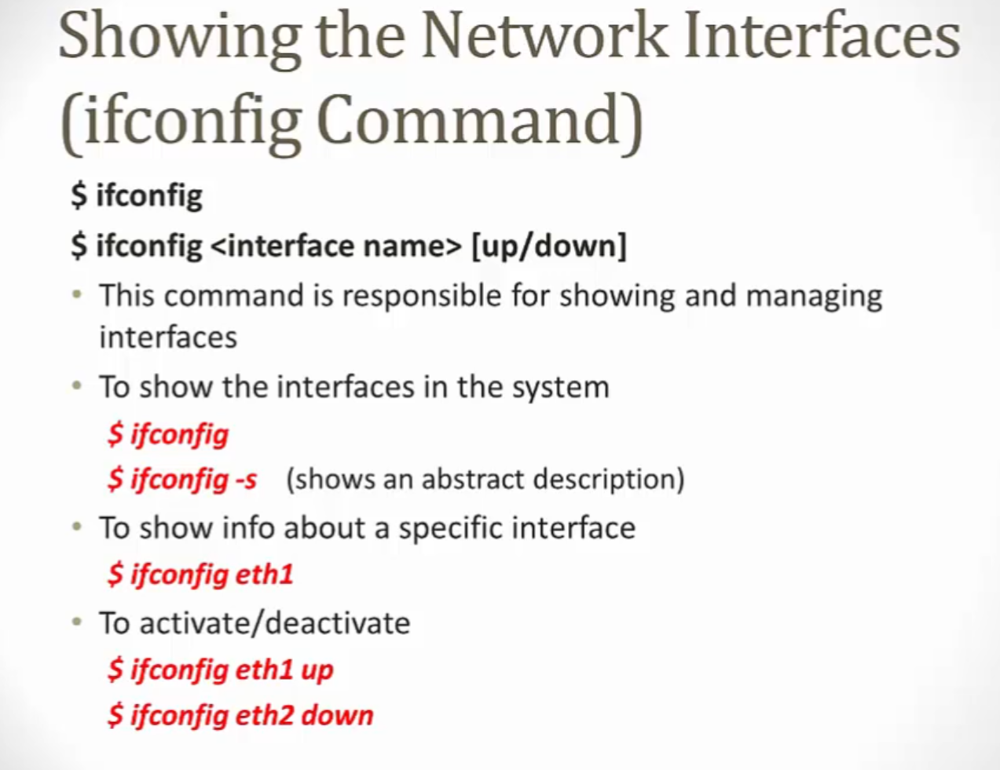

---
---

```plaintext
/boot/
.
├── bcm2711-rpi-4-b.dtb       (52424 bytes) 
├── bootcode.bin              (52476 bytes)
├── boot.scr                  (486 bytes)
├── cmdline.txt               (83 bytes)
├── config.txt                (881 bytes)
├── fixup4.dat                (5456 bytes)
├── Image                     (22233600 bytes)
├── overlays                  (directory)
│   └── ...                   (additional files)
├── start4.elf                (2260128 bytes)
├── u-boot.bin                (665016 bytes)
└── ..
```

# **Networking and Remote Access for Raspberry Pi**



The Raspberry Pi is a versatile and compact computer widely used for projects in embedded systems and IoT. Setting up efficient networking and remote access is essential for managing and interacting with your Raspberry Pi. Below, we detail key methods to achieve seamless networking and remote access.

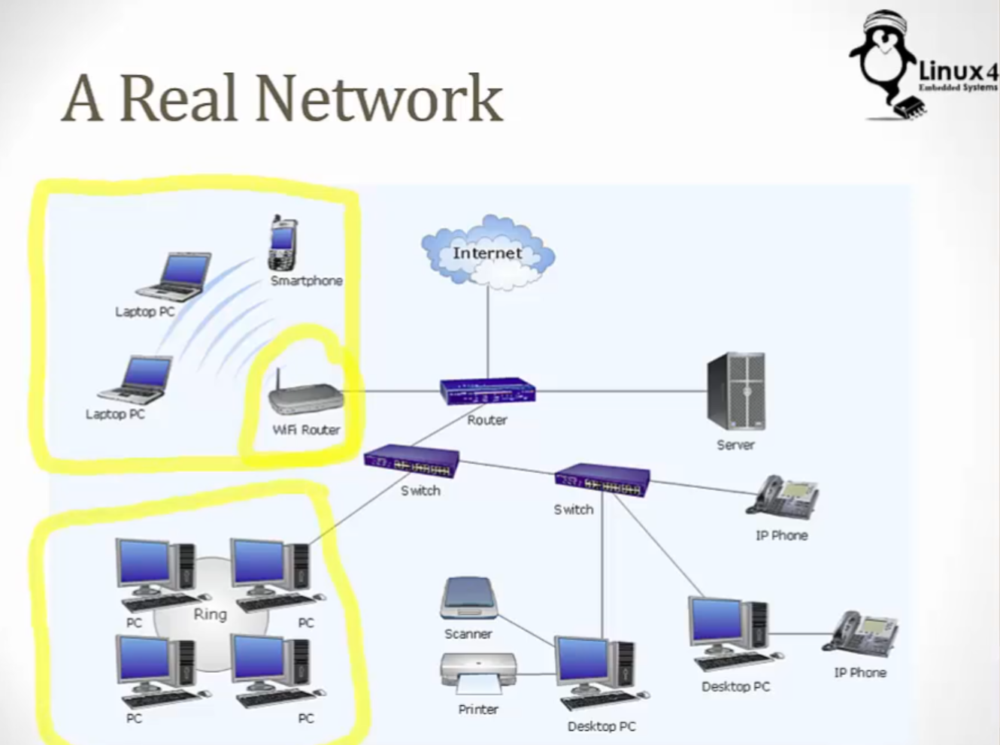

 - SSH 
 - VNC
 - Wi-Fi
 - Bluetooth
 - Pi Connect

[Remote Access to ras pi](https://www.youtube.com/watch?v=l4VDWhKsFgs) | [al arabawy Networking ras pi](https://www.youtube.com/watch?v=IZ5Pz2t-pTI&list=PLWXRxAK4bUzc9gq-W2xWDe9zEaDcowLfs&index=21)

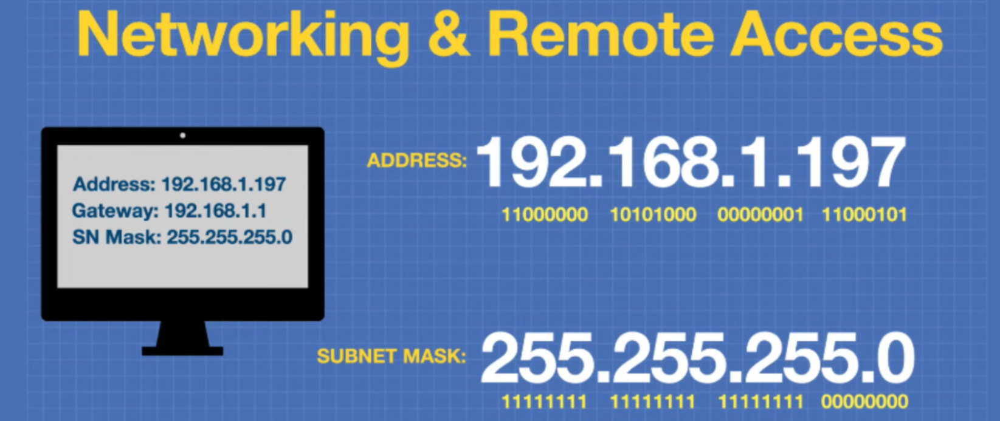

---

## 1. Configuring Network Settings

### Static IP Configuration
Assigning a static IP address to your Raspberry Pi ensures that it maintains the same IP on your network, simplifying remote connections.

1. Open the network configuration file:
   ```bash
   sudo nano /etc/dhcpcd.conf
   ```
2. Add the following configuration for a static IP:
   ```bash
   interface wlan0
   static ip_address=192.168.1.100/24
   static routers=192.168.1.1
   static domain_name_servers=8.8.8.8
   ```
3. Restart the service:
   ```bash
   sudo systemctl restart dhcpcd
   ```

---

## 2. Secure Shell (SSH) Access

SSH allows you to remotely access the Raspberry Pi's command line securely.

### Enabling SSH
1. Enable SSH via `raspi-config`:
   ```bash
   sudo raspi-config
   ```
   Navigate to `Interface Options > SSH > Enable`.

2. Connect to your Raspberry Pi via SSH:
   ```bash
   ssh pi@<raspberry_pi_ip>
   ```

### Enhancing SSH Security
To secure your SSH connection, take the following steps:

- Change the default password:
  ```bash
  passwd
  ```
- Use key-based authentication:
  1. Generate an SSH key pair on your client system:
     ```bash
     ssh-keygen
     ```
  2. Copy the public key to the Raspberry Pi:
     ```bash
     ssh-copy-id pi@<raspberry_pi_ip>
     ```

---

## 3. VNC (Virtual Network Computing)

VNC enables remote desktop access to your Raspberry Pi.

### Enabling VNC
1. Enable VNC via `raspi-config`:
   ```bash
   sudo raspi-config
   ```
   Navigate to `Interface Options > VNC > Enable`.

2. Install VNC Viewer on your client system and connect using the Raspberry Pi's IP address.

---

## 4. Remote Access Over the Internet

### Using Remote.it
Remote.it is a cloud-based service that allows secure remote access to your Raspberry Pi.

1. Install `remote.it`:
   ```bash
   sudo apt update
   sudo apt install connectd
   ```
2. Follow the setup instructions to configure remote access.

### Using Port Forwarding
1. Access your router settings and forward port `22` (SSH) or `5900` (VNC) to your Raspberry Pi's IP address.
2. Use a dynamic DNS service like No-IP to assign a domain name to your public IP.

---

## 5. Wi-Fi Setup

### Manual Wi-Fi Configuration
1. Edit the `wpa_supplicant.conf` file:
   ```bash
   sudo nano /etc/wpa_supplicant/wpa_supplicant.conf
   ```
2. Add your network details:
   ```bash
   network={
       ssid="YourNetworkName"
       psk="YourNetworkPassword"
   }
   ```
3. Restart the service:
   ```bash
   sudo wpa_cli -i wlan0 reconfigure
   ```

---

## 6. Bluetooth Remote Access

Bluetooth allows short-range remote connections to your Raspberry Pi.

1. Enable Bluetooth:
   ```bash
   sudo systemctl start bluetooth
   ```
2. Pair a device:
   ```bash
   bluetoothctl
   scan on
   pair <device_mac_address>
   trust <device_mac_address>
   connect <device_mac_address>
   ```

---

## 7. Advanced Remote Access: Tailscale

Tailscale provides a secure and easy way to connect to your Raspberry Pi over a virtual private network (VPN).

### Setting up Tailscale
1. Install Tailscale:
   ```bash
   curl -fsSL https://tailscale.com/install.sh | sh
   ```
2. Authenticate your device:
   ```bash
   sudo tailscale up
   ```
3. Access your Raspberry Pi using the Tailscale-assigned IP.

---

## 8. Remote Desktop Protocol (RDP)

RDP allows you to access the Raspberry Pi desktop from your computer.

1. Install `xrdp` on the Raspberry Pi:
   ```bash
   sudo apt install xrdp
   ```
2. Use an RDP client to connect using the Raspberry Pi's IP address.

---

## 9. File Sharing with Samba

Samba enables file sharing between the Raspberry Pi and other devices on the same network.

1. Install Samba:
   ```bash
   sudo apt install samba samba-common-bin
   ```
2. Configure a shared folder:
   ```bash
   sudo nano /etc/samba/smb.conf
   ```
   Add the following:
   ```bash
   [shared]
   path = /home/pi/shared
   writeable = yes
   create mask = 0777
   directory mask = 0777
   public = yes
   ```
3. Restart Samba:
   ```bash
   sudo systemctl restart smbd
   ```

---

By implementing these methods, you can efficiently manage and access your Raspberry Pi remotely, ensuring flexibility and productivity for your projects.



| Port Number       | Service/Protocol                               | Description                                                       |
|-------------------|------------------------------------------------|-------------------------------------------------------------------|
| 20                | FTP Data Transfer                              | File Transfer Protocol data transfer                              |
| 21                | FTP Control                                    | File Transfer Protocol control                                    |
| 22                | SSH (Secure Shell)                             | Secure remote login and secure file transfer                      |
| 23                | Telnet                                         | Unencrypted text communication                                    |
| 25                | SMTP (Simple Mail Transfer Protocol)           | Email sending                                                     |
| 53                | DNS (Domain Name System)                       | Resolves domain names to IP addresses                             |
| 67                | DHCP Server                                    | Dynamic Host Configuration Protocol server                        |
| 68                | DHCP Client                                    | Dynamic Host Configuration Protocol client                        |
| 69                | TFTP (Trivial File Transfer Protocol)          | Simple file transfer protocol, often used for booting devices     |
| 80                | HTTP (HyperText Transfer Protocol)             | Standard web traffic                                              |
| 110               | POP3 (Post Office Protocol v3)                 | Email retrieval (from server to client)                           |
| 143               | IMAP (Internet Message Access Protocol)        | Email retrieval (more advanced than POP3)                          |
| 161               | SNMP (Simple Network Management Protocol)      | Network device management and monitoring                           |
| 194               | IRC (Internet Relay Chat)                      | Internet Relay Chat for messaging                                 |
| 443               | HTTPS (HyperText Transfer Protocol Secure)     | Secure version of HTTP (encrypted)                                |
| 445               | SMB (Server Message Block) over TCP            | File and printer sharing in Windows networks                      |
| 465               | SMTPS (SMTP over SSL)                          | Secure email sending                                              |
| 514               | Syslog                                          | System logging service                                            |
| 636               | LDAPS (LDAP over SSL)                          | Secure version of LDAP (Lightweight Directory Access Protocol)    |
| 993               | IMAPS (IMAP over SSL)                          | Secure version of IMAP                                            |
| 995               | POP3S (POP3 over SSL)                          | Secure version of POP3                                            |
| 1080              | SOCKS Proxy                                    | Proxy service for internet traffic                                |
| 1433              | Microsoft SQL Server                           | Microsoft SQL Server database communication                       |
| 1434              | Microsoft SQL Server (UDP)                     | Microsoft SQL Server additional communication                      |
| 3306              | MySQL Database                                 | MySQL database server                                             |
| 3389              | RDP (Remote Desktop Protocol)                  | Microsoft remote desktop access                                   |
| 5060              | SIP (Session Initiation Protocol)              | Used for initiating VoIP calls and multimedia sessions            |
| 5061              | SIP over TLS                                    | Secure version of SIP (encrypted)                                 |
| 5432              | PostgreSQL Database                            | PostgreSQL database server                                        |
| 5900              | VNC (Virtual Network Computing)                | Remote desktop access                                             |
| 6379              | Redis Database                                 | Redis in-memory database                                          |
| 8080              | HTTP Alternative                               | Commonly used as an alternative HTTP port                          |
| 8443              | HTTPS Alternative                              | Commonly used as an alternative HTTPS port                         |
| 11211             | Memcached                                      | Distributed memory caching system                                 |
| 1521              | Oracle Database                                | Oracle database communication                                     |
| 27017             | MongoDB Database                               | MongoDB database communication                                    |
| 50000             | DB2 Database                                   | IBM DB2 database communication                                    |
| 60000-65535       | Dynamic/Private Ports                          | Dynamically assigned by OS for client-side communication           |
| 9898              | Webmin (Web-based system management)           | Webmin management interface                                       |
| 5901              | VNC (Virtual Network Computing)                | VNC on display 1 for remote desktop access                         |
| 631               | CUPS (Common Unix Printing System)             | Printer service for Unix-based systems                            |
| 5222              | XMPP (Extensible Messaging and Presence Protocol) | Messaging protocol for instant messaging                          |
| 6660-6669         | IRC (Internet Relay Chat)                      | Common IRC channels and servers                                   |
| 3307              | MySQL Cluster (NDB)                            | MySQL Cluster management communication                             |
| 3128              | Squid Proxy                                    | HTTP Proxy service                                                 |
| 5431              | NTP (Network Time Protocol)                    | Used for synchronizing time across devices                         |
| 6378              | Elasticsearch                                  | Elasticsearch REST API server                                     |
| 8088              | Hadoop Web UI                                  | Hadoop Web User Interface                                         |
| 9000              | SonarQube                                      | SonarQube code quality management platform                        |
| 5000              | Flask/AI Services                              | Common port used for Python Flask applications, often for AI services |
| 8000              | Jupyter Notebook                               | Port used by Jupyter Notebook for data analysis and AI workloads  |
| 1883              | MQTT (Message Queuing Telemetry Transport)     | Lightweight messaging protocol for IoT, often used in embedded systems and AI |
| 3000              | Node.js Web App                                | Commonly used for development web applications, including AI apps|
| 5000              | AI Services                                    | Common for running AI-related APIs in development                 |
| 6006              | TensorFlow (TensorBoard)                       | TensorFlow web service for monitoring machine learning model training |
| 8082              | JupyterHub                                     | Used for JupyterHub, multi-user access for Jupyter Notebooks      |
| 9090              | Prometheus                                     | Monitoring and alerting system for AI model deployment and embedded systems |
| 8501              | Streamlit                                      | Web interface for machine learning and AI projects (Streamlit framework) |
| 8888              | Jupyter Notebook                               | Standard port for running Jupyter Notebooks, especially for AI experiments |
| 7777              | AI Inference Servers                           | Port often used for AI model inference services (e.g., TensorFlow, PyTorch) |
| 5555              | Android Debug Bridge (ADB)                     | Used for communication between Android devices and development tools, used in embedded systems |


### Static IP (Netplan)
1. `sudo nano /etc/netplan/00-installer-config.yaml`
2. `sudo netplan apply`

### Static IP (NetworkManager)
1. `nmcli con show`
2. `nmcli con edit <connection_name>`
3. `set ipv4.addresses 192.168.1.100/24`
4. `set ipv4.gateway 192.168.1.1`
5. `set ipv4.dns "8.8.8.8 8.8.4.4"`
6. `save`
7. `nmcli con up <connection_name>`

### Dynamic IP (DHCP)
1. `sudo nano /etc/netplan/00-installer-config.yaml`
2. `sudo netplan apply`
3. `sudo dhclient <interface>`

### Dynamic IP (DHCP with dnsmasq)
1. `sudo apt install dnsmasq`
2. `sudo nano /etc/dnsmasq.conf`
3. `sudo systemctl restart dnsmasq`


# **Understanding and Configuring Routing Tables on Linux for Raspberry Pi**



A routing table is a critical component of network management in Linux. On a Raspberry Pi, the routing table determines how data packets are directed between networks. This is especially important when setting up a Raspberry Pi as a router, gateway, or part of a complex network.

## What Is a Routing Table?
A routing table is a data structure used by the Linux kernel to decide how to forward network packets. Each entry in the table specifies a route for a range of IP addresses, the interface to use, and any intermediate gateways.

### Components of a Routing Table
1. **Destination**: The target network or host.
2. **Gateway**: The next hop or intermediary device to forward packets.
3. **Genmask**: The subnet mask that defines the range of addresses in the destination.
4. **Flags**: Indicators for the route (e.g., `U` for up, `G` for gateway).
5. **Metric**: The priority of the route; lower values have higher priority.
6. **Iface**: The network interface (e.g., `eth0`, `wlan0`) used for the route.

### Viewing the Routing Table
To view the current routing table on a Raspberry Pi, use:
```bash
ip route show
```
Or the deprecated but still supported command:
```bash
route -n
```

Example output:
```plaintext
Destination     Gateway         Genmask         Flags Metric Ref    Use Iface
0.0.0.0         192.168.1.1     0.0.0.0         UG    100    0        0 wlan0
192.168.1.0     0.0.0.0         255.255.255.0   U     0      0        0 wlan0
```

### Explanation:
- The first line sets the default route for all outbound traffic through `192.168.1.1` using `wlan0`.
- The second line handles local traffic within the `192.168.1.0/24` subnet via `wlan0`.

## Configuring Routing Tables

### Adding Routes
Use the `ip` command to add routes dynamically:

- **Add a specific route:**
  ```bash
  sudo ip route add 192.168.2.0/24 via 192.168.1.1 dev wlan0
  ```
- **Set a default route:**
  ```bash
  sudo ip route add default via 192.168.1.1 dev wlan0
  ```

To make these changes persistent, modify the configuration file for your network setup:
- If using `dhcpcd`, edit `/etc/dhcpcd.conf`.
- If using `network/interfaces`, update `/etc/network/interfaces`.

Example for `/etc/dhcpcd.conf`:
```plaintext
interface wlan0
static ip_address=192.168.1.100/24
static routers=192.168.1.1
static domain_name_servers=8.8.8.8 8.8.4.4
```

### Deleting Routes
To delete a route:
```bash
sudo ip route del 192.168.2.0/24
```

### Policy-Based Routing
For more advanced scenarios, such as using multiple routing tables:
1. **Create a new routing table:**
   ```bash
   echo "100 custom_table" | sudo tee -a /etc/iproute2/rt_tables
   ```
2. **Add a route to the new table:**
   ```bash
   sudo ip route add 192.168.3.0/24 dev eth0 table custom_table
   ```
3. **Apply a rule to select the table based on source IP:**
   ```bash
   sudo ip rule add from 192.168.1.100/32 lookup custom_table
   ```

## Practical Use Cases

### 1. Raspberry Pi as a Router
A Raspberry Pi can act as a router to connect two networks:
- Enable IP forwarding:
  ```bash
  echo 1 | sudo tee /proc/sys/net/ipv4/ip_forward
  ```
  To make it permanent, edit `/etc/sysctl.conf`:
  ```plaintext
  net.ipv4.ip_forward=1
  ```
- Use `iptables` or `nftables` for NAT:
  ```bash
  sudo iptables -t nat -A POSTROUTING -o wlan0 -j MASQUERADE
  ```

### 2. VPN Gateway
Route traffic through a VPN interface:
- Set the VPN interface as the default route:
  ```bash
  sudo ip route add default dev tun0
  ```

### 3. Load Balancing
Distribute traffic between two gateways:
- Configure routes with different metrics:
  ```bash
  sudo ip route add default via 192.168.1.1 dev wlan0 metric 100
  sudo ip route add default via 192.168.2.1 dev eth0 metric 200
  ```

## Debugging Routing Issues

### Tools
- **Ping**: Verify connectivity.
  ```bash
  ping 8.8.8.8
  ```
- **Traceroute**: Trace the packet path.
  ```bash
  traceroute 8.8.8.8
  ```
- **Tcpdump**: Monitor traffic.
  ```bash
  sudo tcpdump -i wlan0
  ```
- **Netstat**: View active connections and routing table.
  ```bash
  netstat -rn
  ```

### Common Issues
1. **Incorrect Gateway:** Ensure the gateway is reachable.
2. **Subnet Overlap:** Avoid overlapping subnets in your configuration.
3. **Firewall Rules:** Check `iptables` or `nftables` for blocking rules.

## Conclusion
Understanding and managing routing tables on Linux is essential for advanced Raspberry Pi networking setups. Whether you're configuring a simple static route or building a complex policy-based routing system, these steps provide a solid foundation for efficient network management.



# **Understanding and Managing ARP Tables on Raspberry Pi**



The Address Resolution Protocol (ARP) table is a critical component of networking in Linux systems, including the Raspberry Pi. It maps IP addresses to MAC (Media Access Control) addresses, enabling communication within the same network. For specific scenarios on a Raspberry Pi, understanding ARP and its alternatives can enhance your network management capabilities.

## What Is the ARP Table?
The ARP table is a cache maintained by the kernel to store IP-to-MAC address mappings. It is essential for efficient packet delivery in a local network. The Raspberry Pi uses this table to resolve IP addresses to hardware addresses when sending data.

### Viewing the ARP Table
You can view the current ARP table using:
```bash
arp -n
```
Or the newer command with `ip`:
```bash
ip neigh show
```
Example output:
```plaintext
192.168.1.1 dev wlan0 lladdr aa:bb:cc:dd:ee:ff REACHABLE
192.168.1.2 dev wlan0 lladdr aa:bb:cc:dd:ee:00 STALE
```

### Key Fields:
1. **IP Address**: The IP being resolved.
2. **Interface**: The network interface (e.g., `wlan0`, `eth0`).
3. **MAC Address**: The physical address of the device.
4. **State**: The status of the mapping (e.g., `REACHABLE`, `STALE`).

## Managing the ARP Table

### Adding Static Entries
Static ARP entries ensure that specific IPs always resolve to the same MAC address, which can improve security and reliability:
```bash
sudo arp -s 192.168.1.100 aa:bb:cc:dd:ee:11
```
Or using `ip`:
```bash
sudo ip neigh add 192.168.1.100 lladdr aa:bb:cc:dd:ee:11 dev wlan0
```

### Deleting Entries
To remove an entry:
```bash
sudo arp -d 192.168.1.100
```
Or with `ip`:
```bash
sudo ip neigh del 192.168.1.100 dev wlan0
```

### Flushing the ARP Table
Clear all entries to refresh the table:
```bash
sudo ip neigh flush all
```

## ARP Alternatives for Raspberry Pi
In specific use cases, alternative mechanisms can be used instead of ARP:

### 1. **NDP (Neighbor Discovery Protocol)**
For IPv6 networks, ARP is replaced by NDP. NDP provides similar functionality with additional features such as prefix discovery and automatic address configuration.
- View NDP table:
  ```bash
  ip -6 neigh show
  ```
- Add a static entry:
  ```bash
  sudo ip -6 neigh add 2001:db8::1 lladdr aa:bb:cc:dd:ee:11 dev wlan0
  ```

### 2. **Proxy ARP**
A Raspberry Pi can act as a router and respond to ARP requests on behalf of other devices:
- Enable proxy ARP:
  ```bash
  echo 1 | sudo tee /proc/sys/net/ipv4/conf/all/proxy_arp
  ```
- Use `iptables` or `nftables` to forward traffic.

### 3. **Ebtables**
Ebtables operates at Layer 2 (data link layer) and can manage MAC address-based rules, offering finer control over network traffic. It can be useful in bridging setups:
- Install ebtables:
  ```bash
  sudo apt install ebtables
  ```
- Block traffic from a specific MAC address:
  ```bash
  sudo ebtables -A INPUT -s aa:bb:cc:dd:ee:11 -j DROP
  ```

## Debugging ARP Issues

### Common Problems
1. **Duplicate IPs**: Conflicting ARP entries can cause connectivity issues. Use tools like `arp-scan` to identify duplicate IP addresses:
   ```bash
   sudo apt install arp-scan
   sudo arp-scan --localnet
   ```

2. **Stale Entries**: ARP cache may not update dynamically, leading to connectivity problems. Flush the ARP cache to resolve:
   ```bash
   sudo ip neigh flush all
   ```

3. **Unresolved MAC Addresses**: Ensure devices are reachable on the same subnet.

### Monitoring ARP Activity
Use `tcpdump` to capture ARP traffic:
```bash
sudo tcpdump -i wlan0 arp
```

## Use Cases for ARP on Raspberry Pi
1. **Network Bridging**: Use ARP to bridge connections between Ethernet and Wi-Fi.
2. **IoT Device Management**: Track or manage ARP entries for connected devices in an IoT environment.
3. **Security Applications**: Monitor ARP spoofing or enforce static ARP entries for critical devices.

## Conclusion
The ARP table plays a vital role in local networking on Raspberry Pi devices. By understanding how to manage ARP entries and using alternatives like NDP, Proxy ARP, or ebtables, you can optimize network performance and enhance security. This knowledge is especially useful for IoT deployments, custom routers, or advanced networking setups.



# **Internal IP Addressing and NATing for Raspberry Pi 4 Applications**


The Raspberry Pi 4 is a versatile platform for networking tasks, often deployed in home automation, IoT, and small-scale server environments. Understanding internal IP addressing and Network Address Translation (NAT) is essential to configure your Raspberry Pi for these applications effectively.

## 1. What Is Internal IP Addressing?
Internal IP addressing refers to assigning private IP addresses to devices within a local network. These addresses, defined by RFC 1918, are not routable on the public internet. The private IP ranges include:

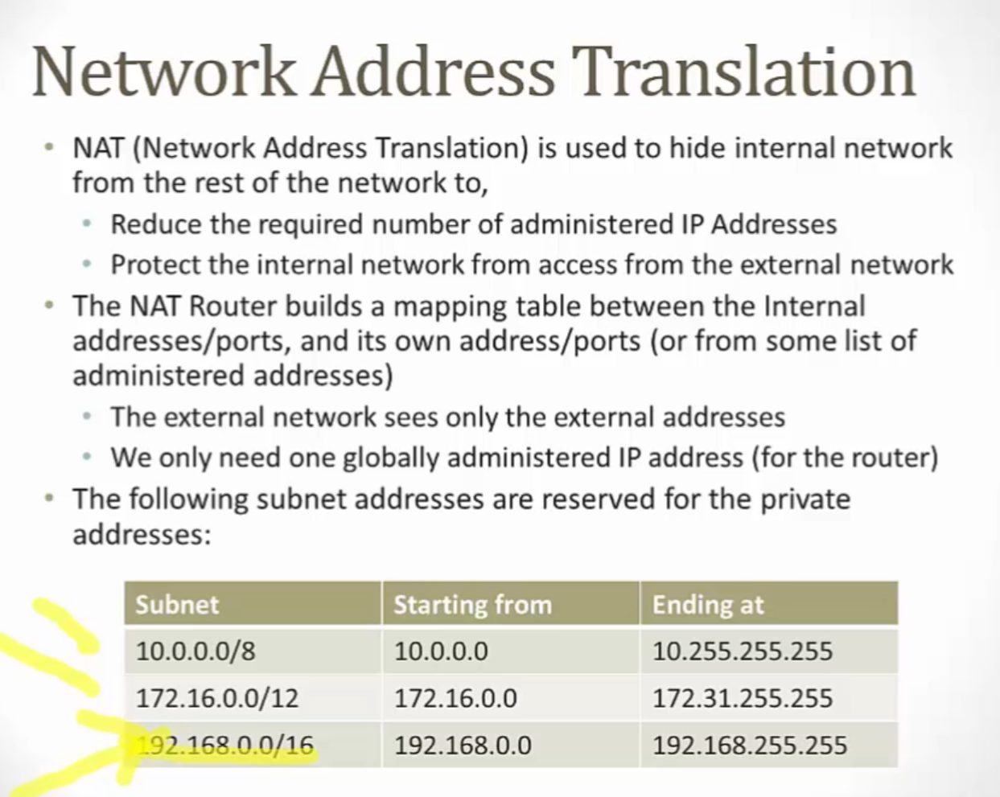

- **Class A**: 10.0.0.0 - 10.255.255.255
- **Class B**: 172.16.0.0 - 172.31.255.255
- **Class C**: 192.168.0.0 - 192.168.255.255

### Assigning an Internal IP to Raspberry Pi 4
1. **Static IP Assignment**:
   - Open the `dhcpcd.conf` file:
     ```bash
     sudo nano /etc/dhcpcd.conf
     ```
   - Add the following lines:
     ```plaintext
     interface wlan0
     static ip_address=192.168.1.100/24
     static routers=192.168.1.1
     static domain_name_servers=8.8.8.8 8.8.4.4
     ```
   - Save and restart the DHCP client:
     ```bash
     sudo systemctl restart dhcpcd
     ```

2. **Dynamic IP Assignment**:
   By default, the Raspberry Pi will obtain an IP from the router's DHCP server.
   ```bash
   ip addr show
   ```
   Use the above command to check the assigned IP.

## 2. What Is NAT (Network Address Translation)?
NAT allows devices with private IPs to communicate with the internet through a public IP address. It is commonly used in scenarios where multiple devices share a single internet connection.

### Types of NAT
1. **SNAT (Source NAT)**: Modifies the source IP of outgoing packets.
2. **DNAT (Destination NAT)**: Modifies the destination IP of incoming packets.
3. **MASQUERADE**: A dynamic form of SNAT, commonly used when the public IP is dynamic.

### Setting Up NAT on Raspberry Pi 4

To enable NAT on Raspberry Pi 4, you can configure it as a router for your local network.

#### Step 1: Enable IP Forwarding
Edit the `sysctl.conf` file:
```bash
sudo nano /etc/sysctl.conf
```
Uncomment or add the following line:
```plaintext
net.ipv4.ip_forward=1
```
Apply the change immediately:
```bash
sudo sysctl -w net.ipv4.ip_forward=1
```

#### Step 2: Configure iptables for NAT
1. Install `iptables` if not already installed:
   ```bash
   sudo apt install iptables
   ```
2. Set up MASQUERADE:
   ```bash
   sudo iptables -t nat -A POSTROUTING -o eth0 -j MASQUERADE
   ```
3. Allow forwarding traffic:
   ```bash
   sudo iptables -A FORWARD -i wlan0 -o eth0 -m state --state RELATED,ESTABLISHED -j ACCEPT
   sudo iptables -A FORWARD -i eth0 -o wlan0 -j ACCEPT
   ```
4. Save the iptables rules:
   ```bash
   sudo iptables-save > /etc/iptables/rules.v4
   ```

#### Step 3: Sharing Internet Access
If your Raspberry Pi is connected to the internet via `eth0` and shares it with `wlan0` clients:

- Install and configure a DHCP server:
  ```bash
  sudo apt install isc-dhcp-server
  ```
- Edit `/etc/dhcp/dhcpd.conf` to set up IP ranges:
  ```plaintext
  subnet 192.168.1.0 netmask 255.255.255.0 {
      range 192.168.1.100 192.168.1.200;
      option routers 192.168.1.1;
      option domain-name-servers 8.8.8.8, 8.8.4.4;
  }
  ```
- Start the DHCP server:
  ```bash
  sudo systemctl start isc-dhcp-server
  ```

## 3. Common Use Cases for NAT and Internal IP Addressing

### Use Case 1: IoT Gateway
A Raspberry Pi can act as a gateway for IoT devices, allowing them to connect to the internet securely while keeping their private IPs hidden.

### Use Case 2: Web Server Hosting
Host a web server on your Raspberry Pi with an internal IP, and use port forwarding or DNAT to make it accessible externally.

### Use Case 3: VPN Router
Set up a VPN server on the Raspberry Pi, using NAT to enable secure communication between devices and the internet.

## 4. Troubleshooting

### Issue: No Internet Access for NAT Clients
- Check if IP forwarding is enabled:
  ```bash
  cat /proc/sys/net/ipv4/ip_forward
  ```
- Verify iptables rules:
  ```bash
  sudo iptables -L -v -n
  ```

### Issue: DHCP Server Not Assigning IPs
- Check the status of the DHCP server:
  ```bash
  sudo systemctl status isc-dhcp-server
  ```
- Verify the DHCP configuration file for errors.

## Conclusion
Internal IP addressing and NAT are fundamental for networking applications on the Raspberry Pi 4. By configuring these features, you can create secure, efficient, and versatile networking environments tailored to various use cases, from IoT gateways to personal servers.



# **Network Applications**

### Domain Names and DNS

Domain names are human-readable addresses used to access resources on the internet. Instead of remembering IP addresses, users rely on domain names, which are resolved into IP addresses by the Domain Name System (DNS). For example, typing `www.example.com` in a browser prompts DNS to resolve this domain name into its corresponding IP address, enabling communication with the target server.

#### Key Components of DNS:
1. **Domain Name Structure:**
   - **Top-Level Domain (TLD):** Examples include `.com`, `.org`, `.net`.
   - **Second-Level Domain (SLD):** The part of the domain chosen by the user, such as `example` in `example.com`.
   - **Subdomain:** A prefix added to a domain, like `blog.example.com`.

2. **DNS Records:**
   - **A Record:** Maps a domain name to an IPv4 address.
   - **AAAA Record:** Maps a domain name to an IPv6 address.
   - **CNAME Record:** Maps one domain name to another.
   - **MX Record:** Directs emails to a mail server.
   - **TXT Record:** Used for various verification purposes.

3. **Types of DNS Servers:**
   - **Recursive Resolver:** Performs the query to find the IP address of a domain.
   - **Root Server:** Provides information about TLDs.
   - **TLD Server:** Provides information about the authoritative server for a domain.
   - **Authoritative Server:** Contains the actual DNS records for a domain.

### Machine Hostname and Aliases

A hostname identifies a device on a network. Each machine can also have aliases, known as **CNAMEs** (Canonical Names) or **nickname aliases**, which provide alternate names for the same machine. For instance, a server with a hostname `server1.local` might have an alias `fileserver.local` for easier identification of its role.

To view or set the hostname on a machine:
- On Linux: Use `hostname` or `hostnamectl`.
- On Windows: Use `hostname` or navigate to System Properties.

### Connectivity Checking

Checking connectivity ensures that networked systems can communicate effectively. Common methods include:

1. **Ping:**
   - Sends ICMP echo requests to a target IP or domain.
   - Usage: `ping example.com`
   - Output provides round-trip time and packet loss.

2. **Traceroute/Tracert:**
   - Traces the path packets take to a destination.
   - Usage: `traceroute example.com` (Linux) or `tracert example.com` (Windows).
   - Displays intermediate hops and their response times.

3. **Netcat (nc):**
   - Verifies port connectivity.
   - Usage: `nc -zv example.com 80` (to check if port 80 is open).

4. **Network Statistics Tools:**
   - **Netstat:** Displays active connections, listening ports, and routing tables.
   - **ss:** A modern replacement for `netstat`, offering detailed socket statistics.
   - **Usage:** `netstat -an` or `ss -tuln`.

### Tracing and Network Statistics

#### Tracing:
Tracing tools like `traceroute` help diagnose latency or routing issues by showing the path data takes through the network. Common options include:
- `-m`: Set the maximum number of hops.
- `-q`: Specify the number of probes per hop.

#### Network Statistics:
Network statistics tools provide insights into network activity:
- **Ifconfig/Ip:** Displays and configures network interfaces.
- **Tcpdump/Wireshark:** Captures and analyzes network traffic.
- **Usage Example:** `tcpdump -i eth0 port 80` (captures HTTP traffic on interface `eth0`).

### Network Applications

Network applications operate either locally (on the same machine) or remotely (across different machines).

#### Local vs. Remote:
- **Local Applications:** Communicate within the same machine, often via loopback interfaces (e.g., `127.0.0.1`). Examples include local databases or development servers.
- **Remote Applications:** Communicate over a network. Examples include web browsers and remote databases.

### Client and Daemon Processes

#### Client Processes:
Clients initiate requests to a server. Examples include:
- **Web Browsers:** Send HTTP/HTTPS requests to servers.
- **SSH Clients:** Connect to remote systems for secure shell access.

#### Daemon Processes:
Daemons are background processes that wait for client requests. Examples include:
- **Web Servers (e.g., Apache, Nginx):** Serve web content.
- **Database Servers (e.g., MySQL, PostgreSQL):** Handle database queries.

### Interactions Between Client and Daemon Processes:
1. **Client Request:** The client sends a request to the server.
2. **Daemon Listening:** The server’s daemon process listens on a specific port.
3. **Response:** The daemon processes the request and sends a response back to the client.

#### Example:
- A browser (client) sends a request to `www.example.com`.
- The web server’s daemon (e.g., Apache) listens on port 80 (HTTP) or 443 (HTTPS).
- The server processes the request and responds with the website content.



# **In-Depth Guide to Network Protocols and Their Security Concerns**


#### Telnet Protocol
Telnet is one of the earliest network protocols designed for remote communication. It allows a user to connect to another computer or device over a network to manage or troubleshoot systems.

- **Usage:**
  ```bash
  telnet <hostname> <port>
  ```
- **Key Features:**
  - Supports basic text-based communication.
  - Operates over TCP port 23 by default.

- **Security Concerns:**
  - **Unencrypted Communication:** Telnet transmits data, including passwords, in plain text, making it vulnerable to eavesdropping.
  - **Alternative:** Use SSH for secure remote communication.

#### FTP (File Transfer Protocol)
FTP facilitates the transfer of files between systems over a network. It uses two channels: a control channel for commands and a data channel for file transfers.

- **Usage:**
  ```bash
  ftp <hostname>
  put <file>    # Upload a file
  get <file>    # Download a file
  ```
- **Key Features:**
  - Default ports: 20 (data transfer) and 21 (control).
  - Supports anonymous login.

- **Security Concerns:**
  - **Unencrypted Transfers:** Data is sent in plain text, including credentials.
  - **Alternatives:** SFTP or FTPS for encrypted file transfers.

#### SSH (Secure Shell)
SSH is a secure protocol for remote login and command execution. It provides encrypted communication between the client and server.

- **Usage:**
  ```bash
  ssh user@hostname
  ```
- **Key Features:**
  - Strong encryption.
  - Port forwarding and tunneling capabilities.

- **Security Concerns:**
  - **Brute Force Attacks:** Use strong passwords or SSH keys.
  - **Misconfigured Access:** Disable root login in `/etc/ssh/sshd_config`.

#### SCP (Secure Copy Protocol)
SCP uses SSH for secure file transfers between systems.

- **Usage:**
  ```bash
  scp file.txt user@remote:/path/
  scp user@remote:/path/file.txt ./
  ```
- **Key Features:**
  - Encryption inherited from SSH.

- **Security Concerns:**
  - Shares the same security considerations as SSH.

#### SFTP (Secure File Transfer Protocol)
SFTP is a secure alternative to FTP, operating over SSH.

- **Usage:**
  ```bash
  sftp user@hostname
  put <file>    # Upload
  get <file>    # Download
  ```
- **Key Features:**
  - Strong encryption and authentication.

- **Security Concerns:**
  - Vulnerable to weak SSH configurations.

#### Remote Desktop Access
Remote desktop protocols enable graphical or command-line access to another machine over a network.

1. **RDP (Remote Desktop Protocol):**
   - **Usage:**
     - Windows: `mstsc`
     - Linux/macOS: Use RDP clients like `remmina`.
   - **Security Concerns:**
     - **Weak Passwords:** Ensure strong authentication.
     - **Open Ports:** Restrict RDP ports (default: 3389) and use VPNs.

2. **VNC (Virtual Network Computing):**
   - **Usage:**
     ```bash
     vncviewer <hostname>
     ```
   - **Security Concerns:**
     - Vulnerable to eavesdropping without encryption. Use SSH tunneling.

#### Newer Protocols and Tools

1. **Mosh (Mobile Shell):**
   - A modern alternative to SSH with better support for intermittent connectivity.
   - **Usage:**
     ```bash
     mosh user@hostname
     ```

2. **Rsync:**
   - Efficient tool for file synchronization and transfer.
   - **Usage:**
     ```bash
     rsync -avz source/ user@remote:/path/
     ```

#### General Security Recommendations for All Protocols

1. **Encryption:** Use protocols that support encrypted communication, such as SSH, SFTP, and FTPS.
2. **Authentication:**
   - Use key-based authentication for SSH.
   - Avoid weak passwords.
3. **Firewall Configuration:** Restrict access to essential ports.
4. **Updates:** Keep software updated to address vulnerabilities.
5. **Monitoring:** Use tools like intrusion detection systems (IDS) and log analyzers to detect suspicious activity.

By understanding these protocols and their associated security concerns, you can ensure safe and efficient network communication.



# **GPIO Configuration**


 - **TX (Transmitter) on USB-TTL -> RX (GPIO15) on Raspberry Pi**

 - **RX (Receiver) on USB-TTL -> TX (GPIO14) on Raspberry Pi**

 - **GND (Ground) on USB-TTL -> GND (GPIO6) on Raspberry Pi**

> If your USB-TTL adapter provides VCC, do not connect it to the Raspberry Pi, as the Pi uses 3.3V logic and not 5V. Connecting 5V could damage the Pi.

[MiniCom](https://www.youtube.com/watch?v=35gdWj94-lQ)

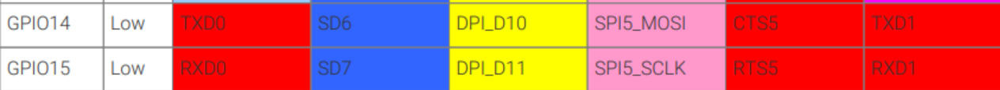
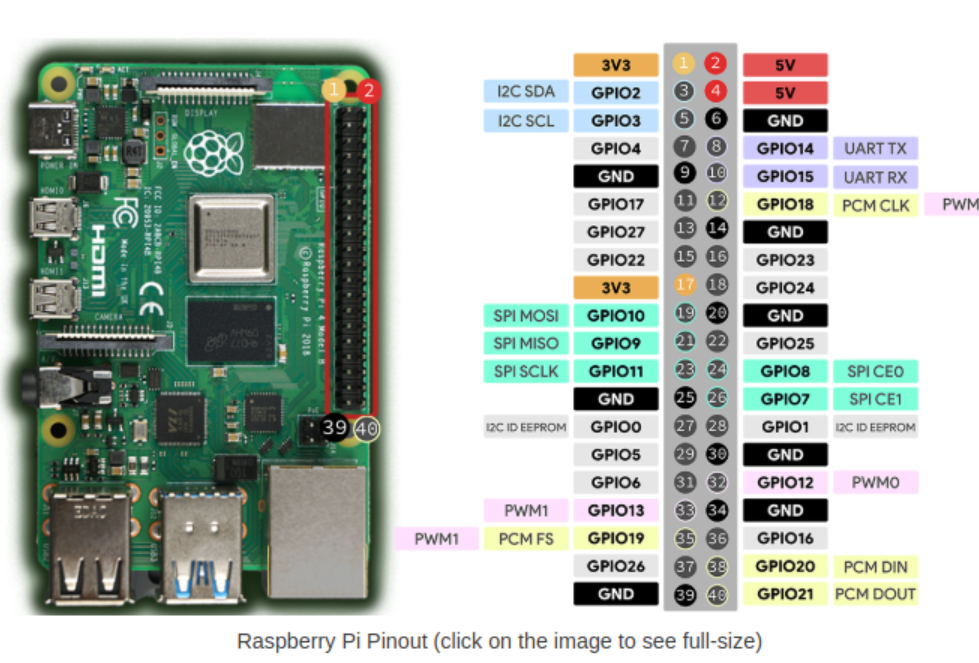

```bash

ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ sudo apt-get install minicom


ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ cd /dev/

ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ dmesg | grep pl2303



ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ sudo dmesg | grep tty
    [    0.113754] printk: legacy console [tty0] enabled
    [    9.596621] cdc_acm 1-9:1.0: ttyACM0: USB ACM device
    [ 2909.099434] usb 1-3: pl2303 converter now attached to ttyUSB0   ---> our target


ferganey@ferganey-linux:/dev$ sudo minicom -s

```

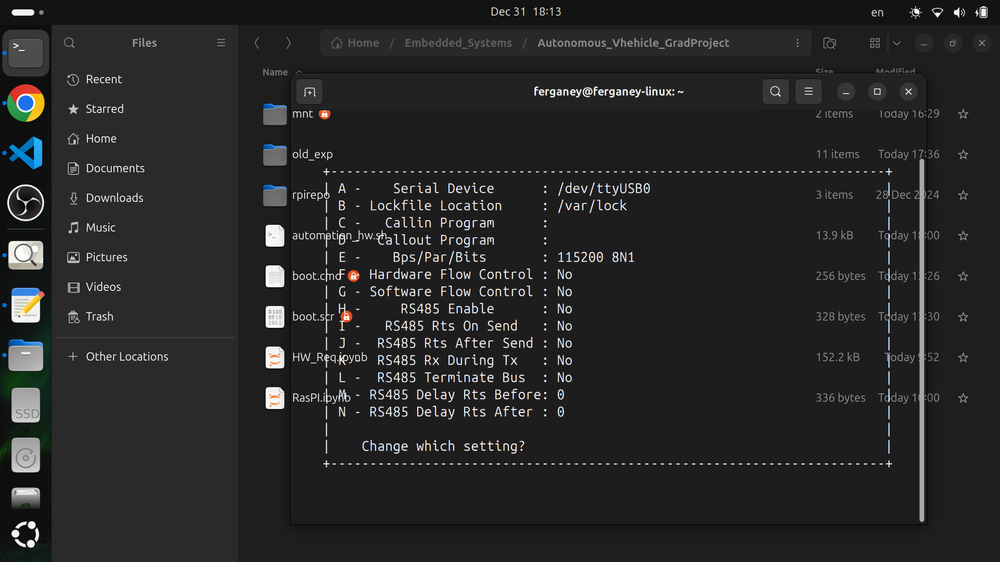

```bash

ferganey@ferganey-linux:/etc/minicom$ ls
    minirc.nullmodem  minirc.rpi4

ferganey@ferganey-linux:/etc/minicom$ sudo nano /etc/minicom/minirc.rpi4
```

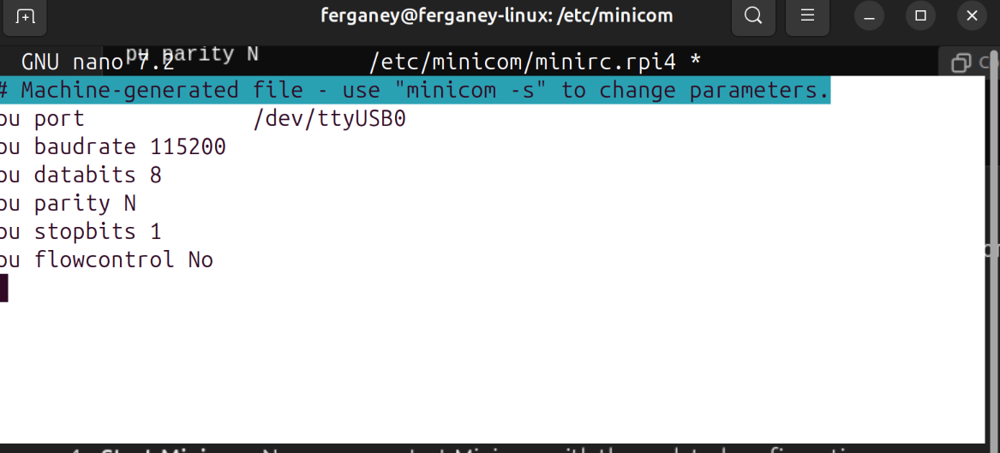

```bash

ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ sudo apt-get install -y libusb-dev

ferganey@ferganey-linux:/etc/minicom$ sudo usermod -aG dialout $USER

ferganey@ferganey-linux:~/Embedded_Systems/Autonomous_Vhehicle_GradProject$ sudo minicom -D /dev/ttyUSB0 -C /etc/minicom/minirc.dfl 



```

then power RAS PI and Enjoy...

[](https://pinout.xyz/) | [](https://randomnerdtutorials.com/raspberry-pi-pinout-gpios/#:~:text=The%20Raspberry%20Pi%204%20Model,UART%20communication%20protocols%20or%20PWM.) | [](https://toptechboy.com/understanding-raspberry-pi-4-gpio-pinouts/)

**Most Important Resources**

[build-a-raspbery-pi-linux-system-the-hard](https://rickcarlino.com/2021/build-a-raspbery-pi-linux-system-the-hard-way.html) | [RPI4_custom_image](https://github.com/yusufsakr/RPI4_custom_image) | [Linux_Raspberrypi3b_image](https://github.com/Moatasem-Elsayed/Linux_Raspberrypi3b_image) | [pi-file-system](https://iotstarters.com/understanding-raspberry-pi-file-system/)